In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import seaborn as sns
import arviz as az
from scipy.interpolate import griddata
import pymc3 as pm

In [2]:
%config InlineBackend.figure_format='retina'

# Geocentric Models

## Codes 

### Code 4.1

In [3]:
pos = np.array([np.random.uniform(low=-1, high=1, size=16).sum() for _ in range(1000)])

<AxesSubplot:ylabel='Density'>

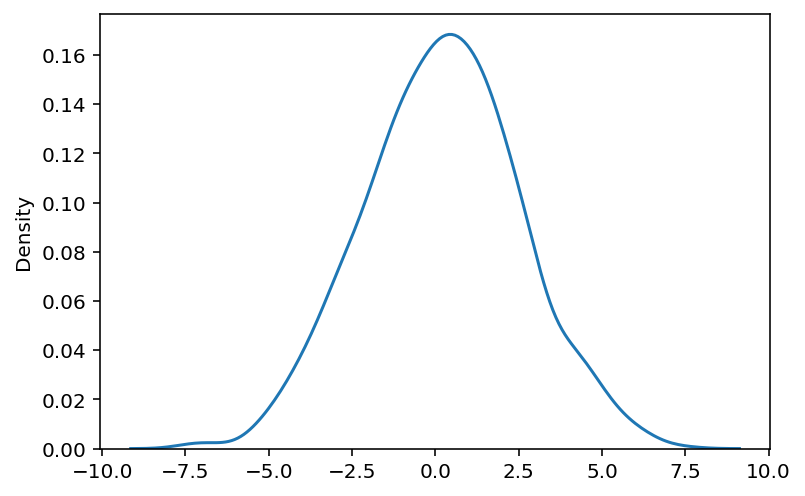

In [4]:
sns.kdeplot(pos)

### Code 4.2

In [5]:
(1 + np.random.uniform(low=0, high=.1, size=12)).prod()

1.836016460766778

### Code 4.3

In [6]:
pos = np.array([(1 + np.random.uniform(low=0, high=.1, size=12)).prod() for _ in range(1000)])

<AxesSubplot:ylabel='Density'>

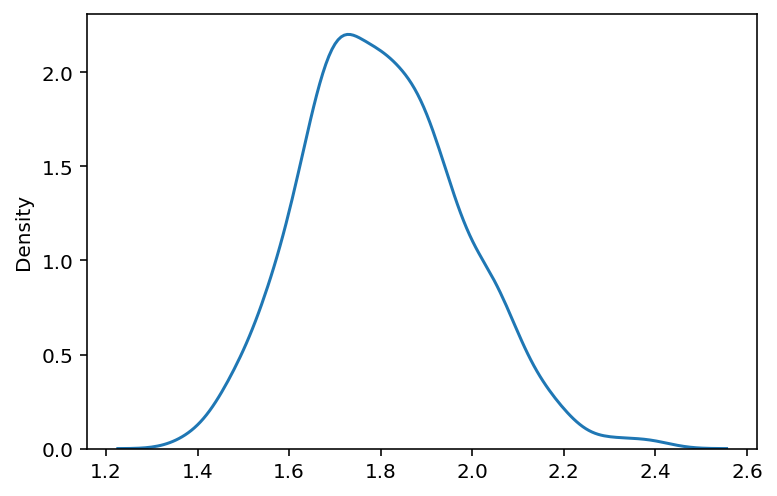

In [7]:
sns.kdeplot(pos)

### Code 4.4

<AxesSubplot:ylabel='Density'>

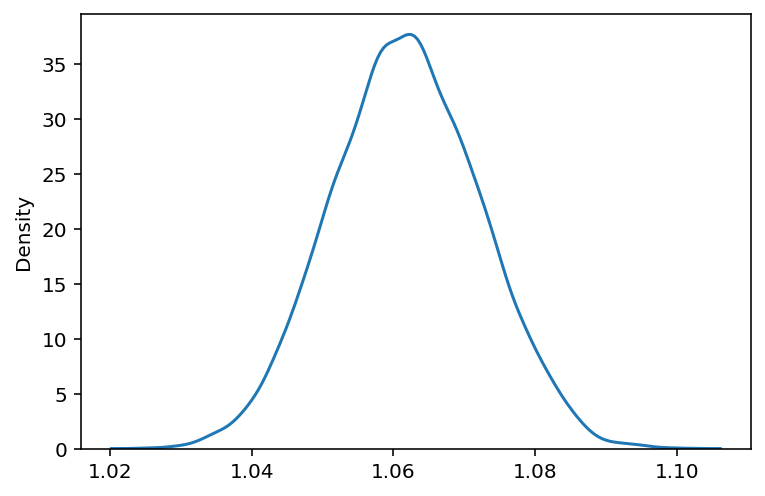

In [8]:
small = (1 + np.random.uniform(low=0, high=.01, size=(12, 10000))).prod(axis=0)
sns.kdeplot(small)

<AxesSubplot:ylabel='Density'>

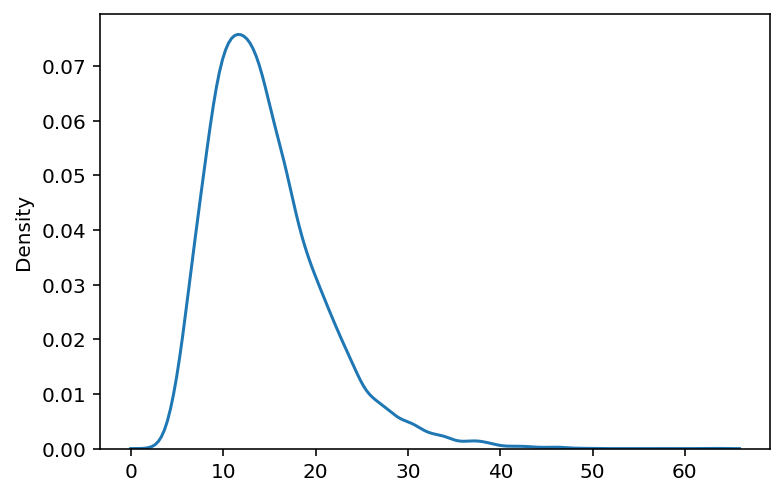

In [9]:
big = (1 + np.random.uniform(low=0, high=.5, size=(12, 10000))).prod(axis=0)
sns.kdeplot(big)

### Code 4.5

<AxesSubplot:ylabel='Density'>

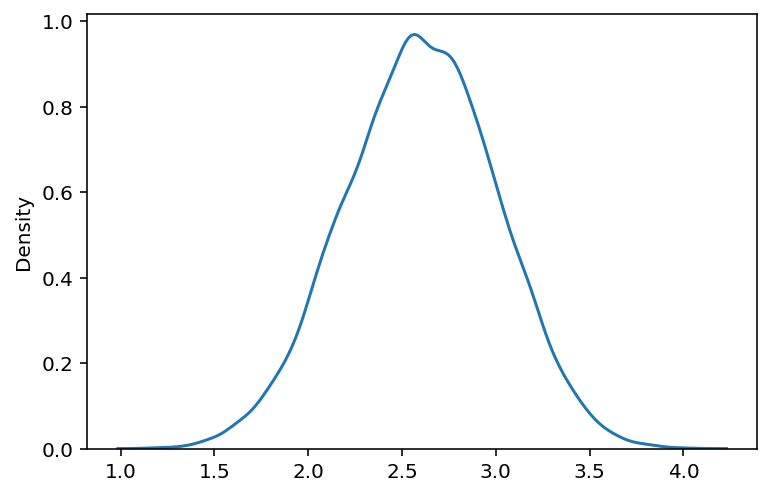

In [10]:
logbig = np.log((1 + np.random.uniform(low=0, high=.5, size=(12, 10000))).prod(axis=0))
sns.kdeplot(logbig)

### Code 4.6

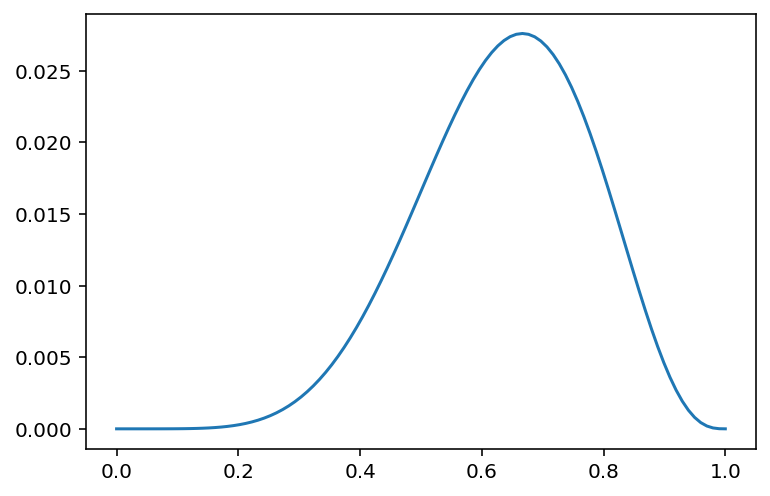

In [11]:
w = 6
n = 9
p_grid = np.linspace(0, 1, 100)
posterior = stats.binom.pmf(k=w, n=n, p=p_grid) * stats.uniform.pdf(p_grid, 0, 1)
posterior = posterior/posterior.sum()

plt.plot(p_grid, posterior)
plt.show()

### Code 4.7

In [12]:
d = pd.read_csv("../data/Howell1.csv", sep=';')

### Code 4.8

In [13]:
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0


### Code 4.9

In [14]:
d.describe(percentiles=[.055, .945])

,height,weight,age,male
count,544.000000,544.000000,544.000000,544.000000
mean,138.263596,35.610618,29.344393,0.472426
std,27.602448,14.719178,20.746888,0.499699
min,53.975000,4.252425,0.000000,0.000000
5.5%,81.108550,9.360721,1.000000,0.000000
50%,148.590000,40.057844,27.000000,0.000000
94.5%,165.735000,54.502894,66.135000,1.000000
max,179.070000,62.992589,88.000000,1.000000


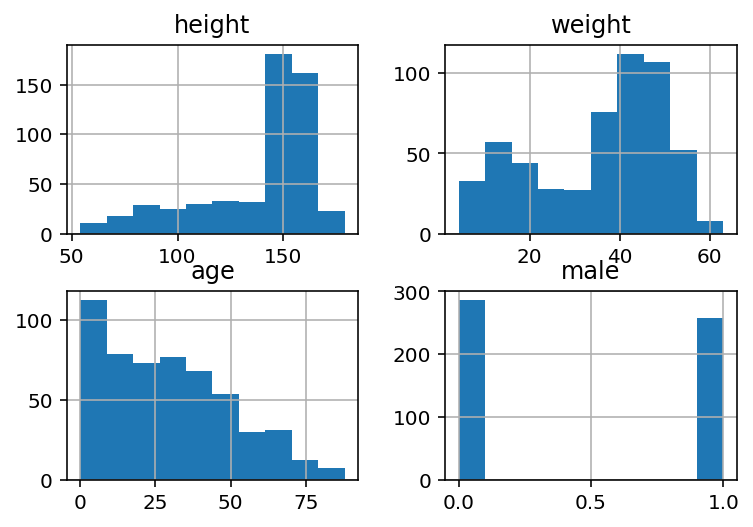

In [15]:
d.hist()
plt.show()

### Code 4.10

In [16]:
d['height']

0      151.765
1      139.700
2      136.525
3      156.845
4      145.415
        ...   
539    145.415
540    162.560
541    156.210
542     71.120
543    158.750
Name: height, Length: 544, dtype: float64

### Code 4.11

In [17]:
d2 = d[d['age'] >= 18].reset_index(drop=True)
d2.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0


### Code 4.12

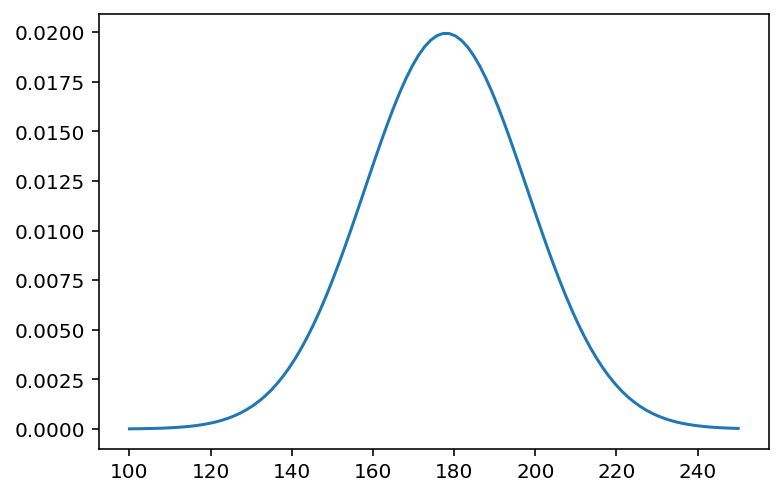

In [18]:
xgrid = np.linspace(start=100, stop=250, num=100)
ygrid = stats.norm(178, 20).pdf(xgrid)
plt.plot(xgrid, ygrid)
plt.show()

### Code 4.13

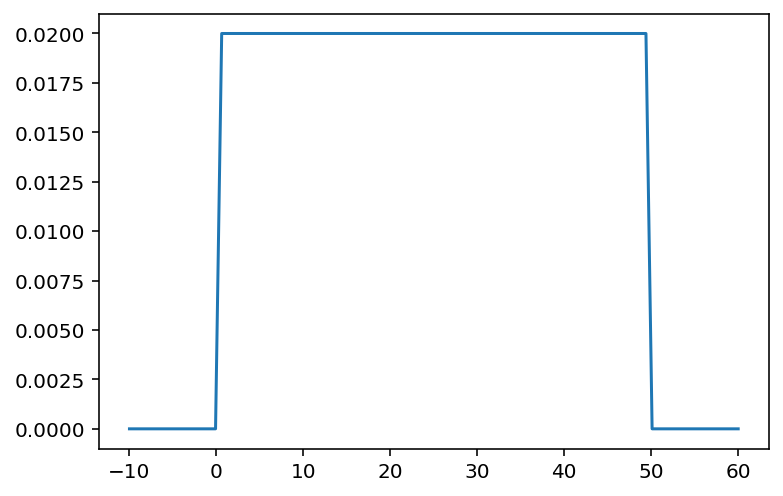

In [19]:
xgrid = np.linspace(start=-10, stop=60, num=100)
ygrid = stats.uniform(0, 50).pdf(xgrid)
plt.plot(xgrid, ygrid)
plt.show()

### Code 4.14

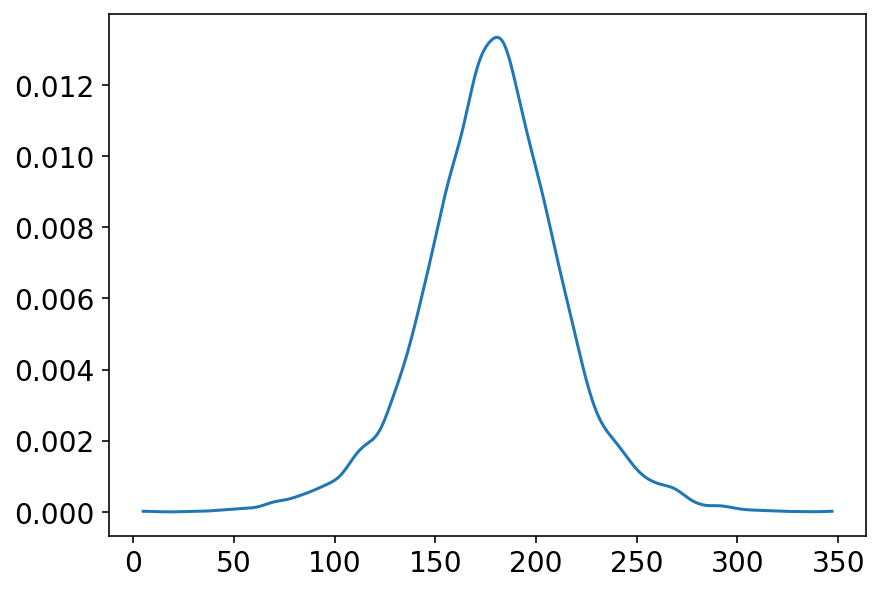

In [20]:
sample_mu = stats.norm(178, 20).rvs(10000)
sample_sigma = stats.uniform(0, 50).rvs(10000)
prior_h = stats.norm(sample_mu, sample_sigma).rvs()
az.plot_kde(prior_h)
plt.show()

### Code 4.15

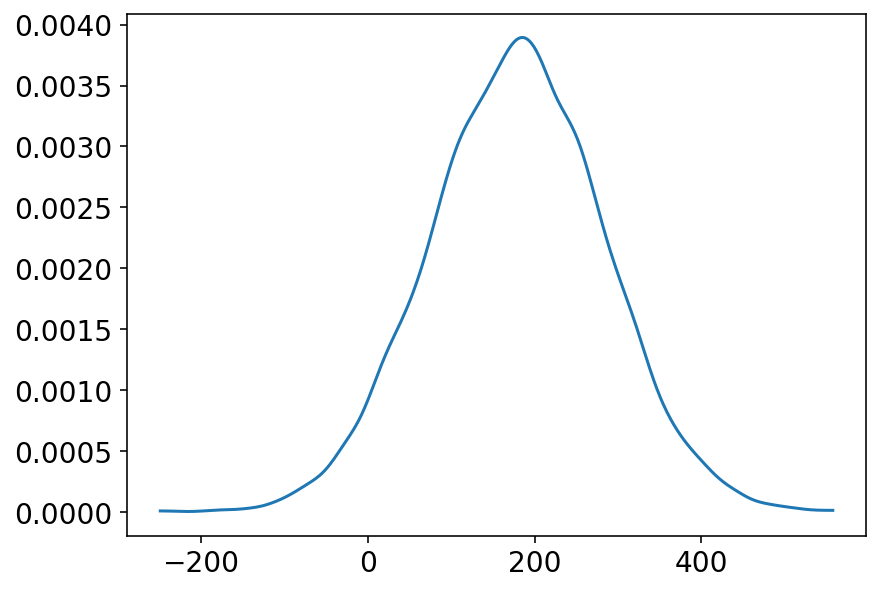

In [21]:
sample_mu = stats.norm(178, 100).rvs(10000)
sample_sigma = stats.uniform(0, 50).rvs(10000)
prior_h = stats.norm(sample_mu, sample_sigma).rvs()
az.plot_kde(prior_h)
plt.show()

### Code 4.16

In [22]:
mu_list = np.linspace(150, 160, 100)
sigma_list = np.linspace(7, 9, 100)
post = np.array(np.meshgrid(mu_list, sigma_list)).reshape(2, -1).T

In [23]:
likelihood = []
for i in range(len(post)):
    x = stats.norm(loc=post[i, 0], scale=post[i, 1]).logpdf(d2['height']).sum()
    likelihood.append(x)
    
likelihood = np.array(likelihood)

In [24]:
post_prob = likelihood + \
    stats.norm(loc=178, scale=20).logpdf(post[:, 0]) + \
    stats.uniform(loc=0, scale=50).logpdf(post[:, 1])

In [25]:
post_prob = np.exp(post_prob - post_prob.max())

### Code 3.17

In [26]:
xi = np.linspace(post[:, 0].min(), post[:, 0].max(), 100)
yi = np.linspace(post[:, 1].min(), post[:, 1].max(), 100)
zi = griddata((post[:, 0], post[:, 1]), post_prob, (xi[None, :], yi[:, None]))

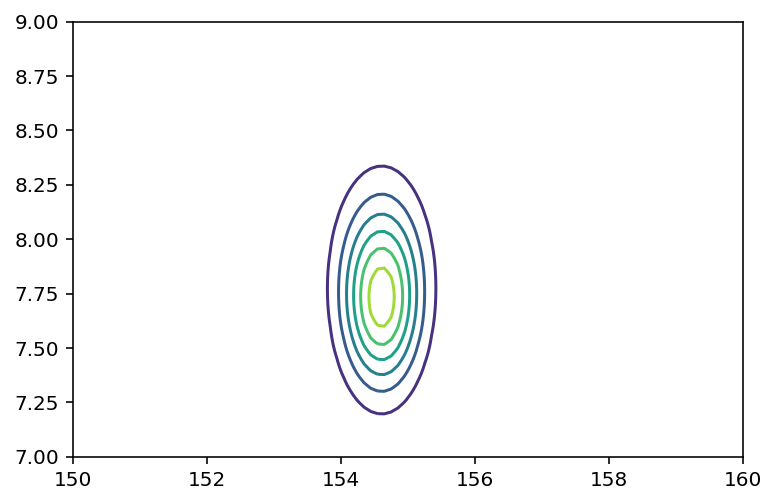

In [27]:
plt.contour(xi, yi, zi);
plt.show()

### Code 4.18

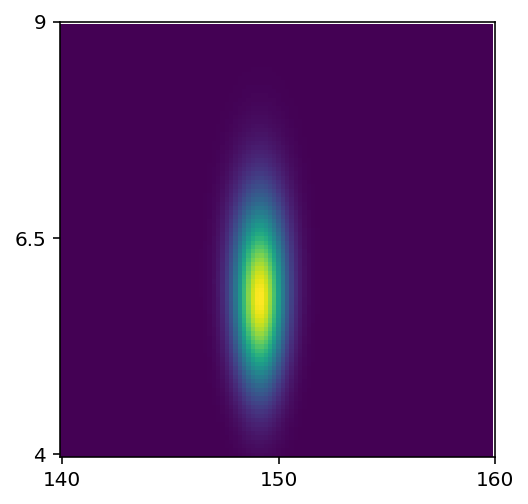

In [28]:

_, ax = plt.subplots()
ax.imshow(zi, origin="lower")
ax.set_xticks([0, 50, 100])
ax.set_xticklabels([140, 150, 160])
ax.set_yticks([0, 50, 100])
ax.set_yticklabels([4, 6.5, 9])
ax.grid(False);

### Code 4.19

In [29]:
sample_rows = np.random.choice(
    np.arange(len(post)), size=10000, replace=True, p=(post_prob / post_prob.sum())
)
sample_mu = post[:, 0][sample_rows]
sample_sigma = post[:, 1][sample_rows]

### Code 4.20

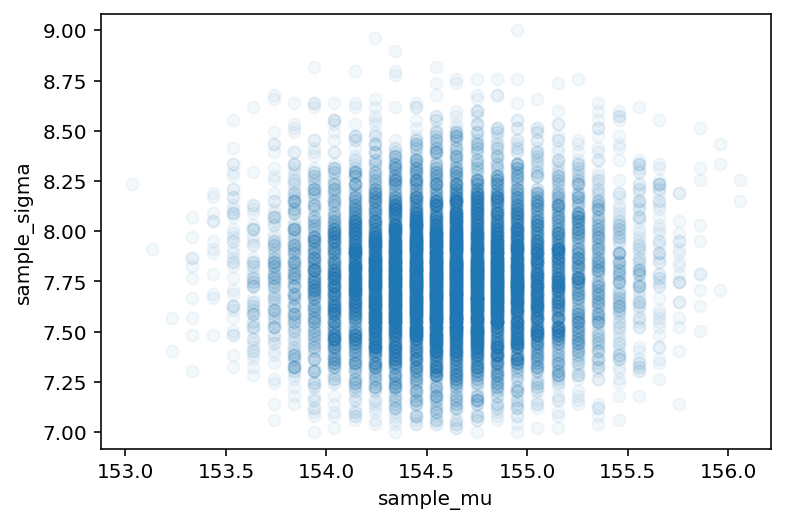

In [30]:
plt.plot(sample_mu, sample_sigma, "o", alpha=0.05)
plt.axis("equal")
plt.grid(False)
plt.xlabel("sample_mu")
plt.ylabel("sample_sigma");

### Code 4.21

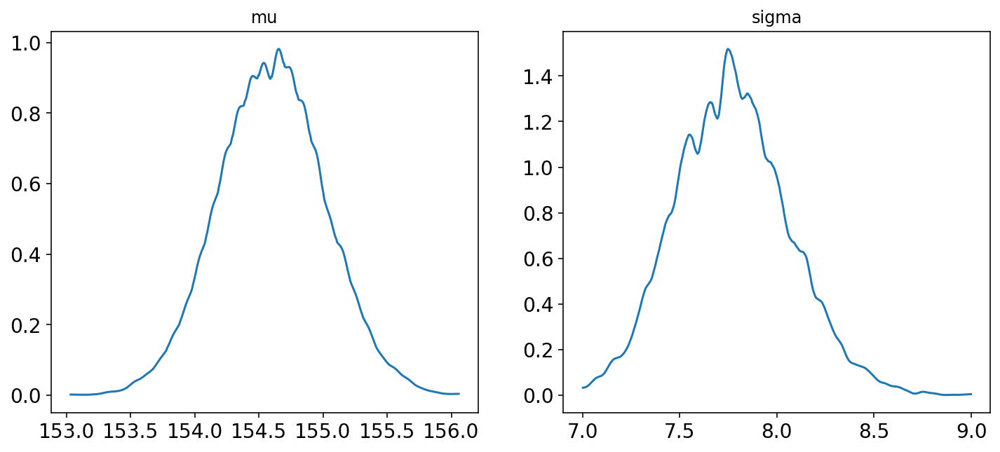

In [31]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

az.plot_kde(sample_mu, ax=ax1, bw=.05)
az.plot_kde(sample_sigma, ax=ax2)

ax1.set_title('mu')
ax2.set_title('sigma')
plt.show()

### Code 4.22

In [32]:
az.hdi(sample_mu, hdi_prob=.89)

array([153.83838384, 155.15151515])

In [33]:
az.hdi(sample_sigma, hdi_prob=.89)

array([7.32323232, 8.23232323])

### Code 4.23

In [34]:
d3 = np.random.choice(d2['height'], size=20)

In [35]:
d3

array([142.113, 163.195, 163.195, 147.955, 154.94 , 154.305, 148.59 ,
       148.59 , 154.94 , 149.86 , 156.845, 149.225, 147.955, 162.56 ,
       160.655, 161.29 , 153.035, 157.48 , 144.145, 157.48 ])

### Code 4.24

In [36]:
mu_list = np.linspace(150, 170, 200)
sigma_list = np.linspace(4, 20, 200)
post = np.array(np.meshgrid(mu_list, sigma_list)).reshape(2, -1).T

In [37]:
likelihood = []
for i in range(len(post)):
    x = stats.norm(loc=post[i, 0], scale=post[i, 1]).logpdf(d3).sum()
    likelihood.append(x)
    
likelihood = np.array(likelihood)

In [38]:
post_prob = likelihood + \
    stats.norm(loc=178, scale=20).logpdf(post[:, 0]) + \
    stats.uniform(loc=0, scale=50).logpdf(post[:, 1])

In [39]:
post_prob = np.exp(post_prob - post_prob.max())

In [40]:
sample_rows = np.random.choice(
    np.arange(len(post)), size=10000, replace=True, p=(post_prob / post_prob.sum())
)
sample_mu = post[:, 0][sample_rows]
sample_sigma = post[:, 1][sample_rows]

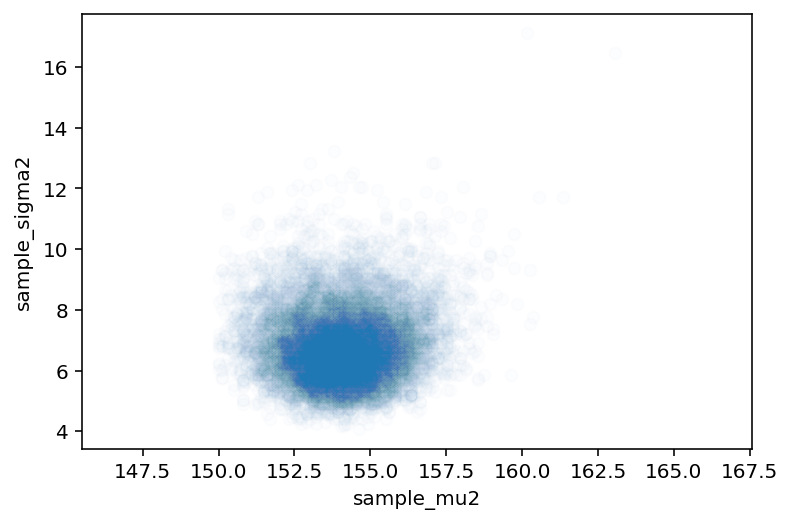

In [41]:
plt.plot(sample_mu, sample_sigma, "o", alpha=0.01)
plt.axis("equal")
plt.xlabel("sample_mu2")
plt.ylabel("sample_sigma2")
plt.grid(False);

### Code 4.25

<AxesSubplot:>

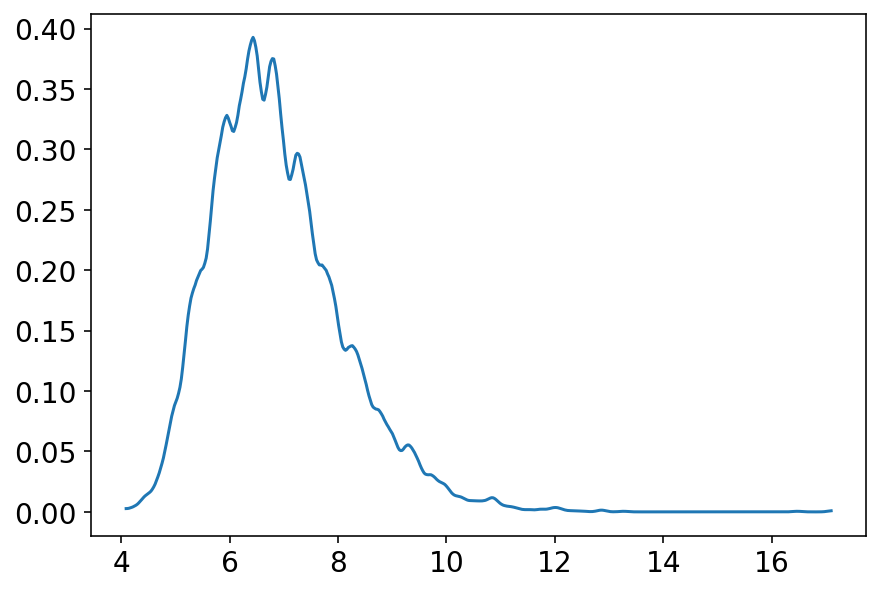

In [42]:
az.plot_kde(sample_sigma)

### Code 4.26

In [43]:
d = pd.read_csv("../data/Howell1.csv", sep=';')
d2 = d[d['age'] >= 18].reset_index(drop=True)

### Code 4.27

In [44]:
with pm.Model() as model_4_1:
    mu = pm.Normal('mu', mu=178, sigma=20)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])

### Code 4.28

In [45]:
with model_4_1:
    trace_4_1 = pm.sample(1000, tune=1000)

<ipython-input-45-b291dc73a7a5>:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_1 = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, mu]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 14 seconds.


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


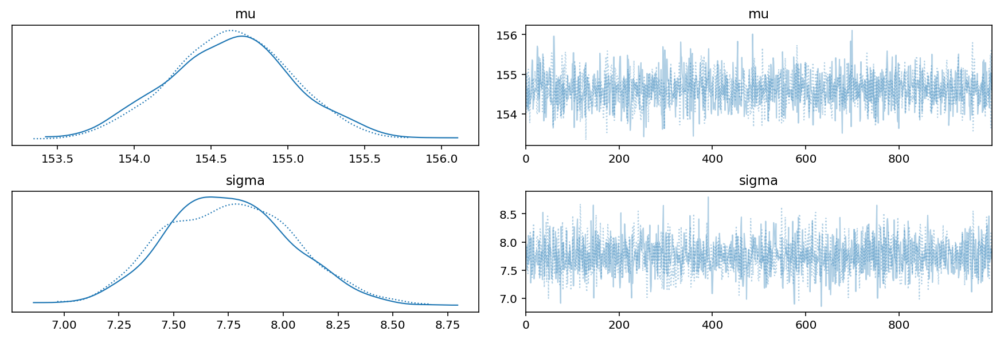

In [46]:
az.plot_trace(trace_4_1)
plt.show()

### Code 4.29

In [47]:
az.summary(trace_4_1, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,154.627,0.405,153.993,155.299,0.009,0.007,1906.0,1108.0,1.0
sigma,7.752,0.293,7.322,8.250,0.007,0.005,1767.0,1427.0,1.0


### Code 4.30

In [48]:
with pm.Model() as model_4_1:
    mu = pm.Normal('mu', mu=178, sigma=20, testval=d2['height'].mean())
    sigma = pm.Uniform('sigma', lower=0, upper=50, testval=d2['height'].std())
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    trace_4_1 = pm.sample(10000, tune=1000)

<ipython-input-48-bc7435be20a2>:5: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_1 = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, mu]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 19 seconds.


In [49]:
az.summary(trace_4_1, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,154.601,0.413,153.919,155.235,0.003,0.002,17265.0,13853.0,1.0
sigma,7.765,0.289,7.291,8.214,0.002,0.002,17729.0,15107.0,1.0


### Code 4.31

In [50]:
with pm.Model() as model_4_2:
    mu = pm.Normal('mu', mu=178, sigma=0.1, testval=d2['height'].mean())
    sigma = pm.Uniform('sigma', lower=0, upper=50, testval=d2['height'].std())
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    trace_4_2 = pm.sample(10000, tune=1000)

<ipython-input-50-bf77437bdc72>:5: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_2 = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, mu]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 24 seconds.


In [51]:
az.summary(trace_4_2)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,177.863,0.101,177.674,178.054,0.001,0.001,14862.0,13136.0,1.0
sigma,24.616,0.929,22.906,26.387,0.007,0.005,15458.0,13485.0,1.0


### Code 4.32

In [52]:
trace_4_1_df = pm.trace_to_dataframe(trace_4_1)
trace_4_1_df.cov()

,mu,sigma
mu,0.170315,-0.001758
sigma,-0.001758,0.083685


### Code 4.33

In [53]:
np.diag(trace_4_1_df.cov())

array([0.17031519, 0.08368521])

In [54]:
trace_4_1_df.corr()

,mu,sigma
mu,1.000000,-0.014723
sigma,-0.014723,1.000000


### Code 4.34

In [55]:
trace_4_1_df.head()

,mu,sigma
0,154.645064,7.746311
1,154.767770,7.614395
2,154.958200,8.136643
3,154.726381,7.998561
4,154.892551,7.673399


### Code 4.35

In [56]:
trace_4_1_df.describe(percentiles=[.055, .945])

,mu,sigma
count,20000.000000,20000.000000
mean,154.601428,7.764552
std,0.412693,0.289284
min,152.917798,6.753513
5.5%,153.942672,7.315386
50%,154.602224,7.756514
94.5%,155.259698,8.242710
max,156.417669,9.083683


In [57]:
az.summary(trace_4_1)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu,154.601,0.413,153.818,155.373,0.003,0.002,17265.0,13853.0,1.0
sigma,7.765,0.289,7.221,8.307,0.002,0.002,17729.0,15107.0,1.0


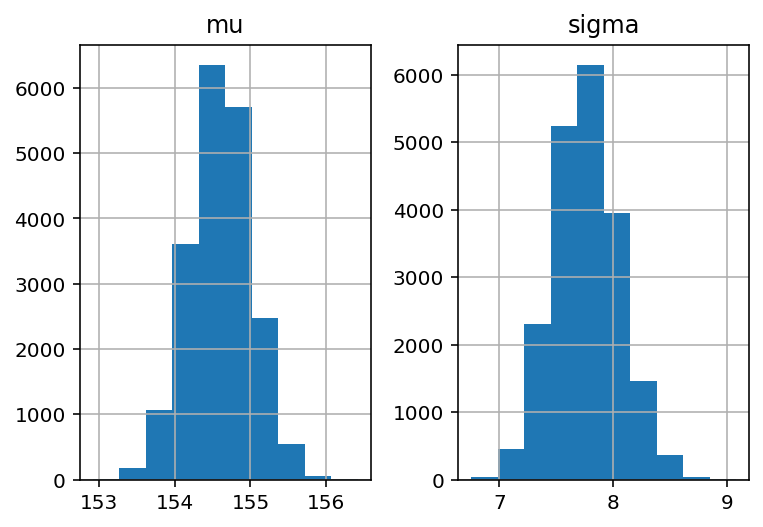

In [58]:
trace_4_1_df.hist()
plt.show()

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'mu'}>,
        <AxesSubplot:title={'center':'mu'}>],
       [<AxesSubplot:title={'center':'sigma'}>,
        <AxesSubplot:title={'center':'sigma'}>]], dtype=object)

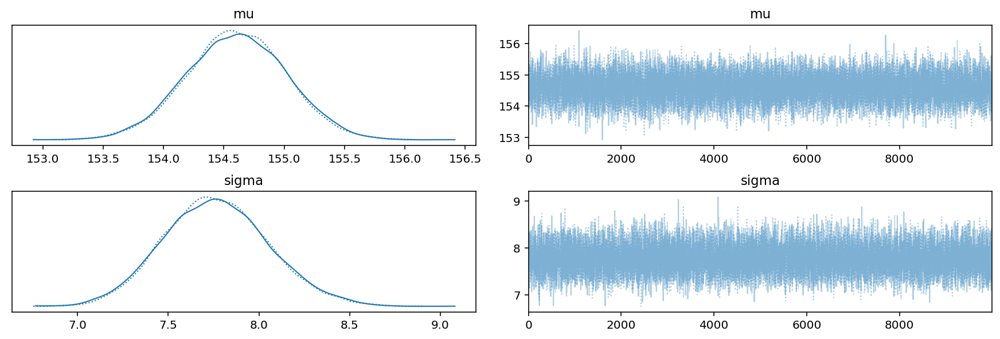

In [59]:
az.plot_trace(trace_4_1)

### Code 4.36

In [60]:
post = stats.multivariate_normal.rvs(mean=trace_4_1_df.mean(), cov=trace_4_1_df.cov(), size=10000)
post[:5, :]

array([[154.59748894,   7.8168512 ],
       [153.99785606,   7.72120782],
       [154.77316828,   7.91624961],
       [154.83725482,   8.14233763],
       [154.97819284,   8.05246805]])

### Code 4.37

<AxesSubplot:xlabel='weight', ylabel='height'>

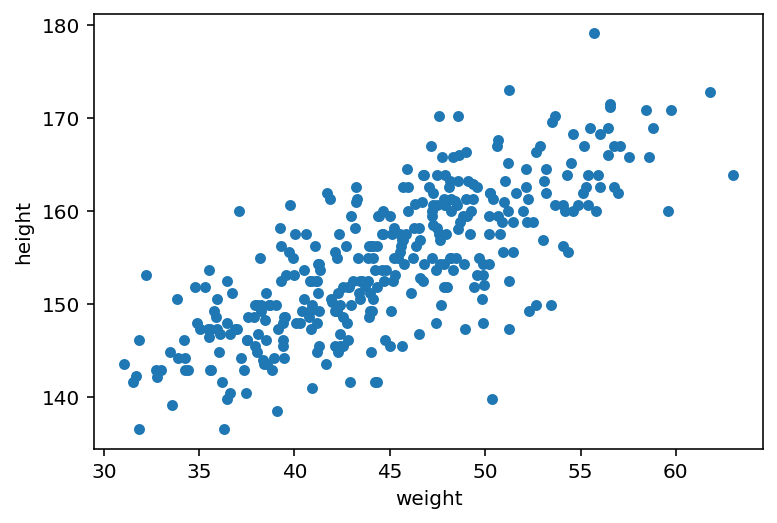

In [61]:
d2.plot('weight', 'height', kind='scatter')

### Code 4.38

In [62]:
np.random.seed(2971)
N = 100

a = stats.norm(178, 20).rvs(N)
b = stats.norm(0, 10).rvs(N)

### Code 4.39-4.41

In [63]:
x = np.linspace(d2['weight'].min(), d2['weight'].max(), 100)


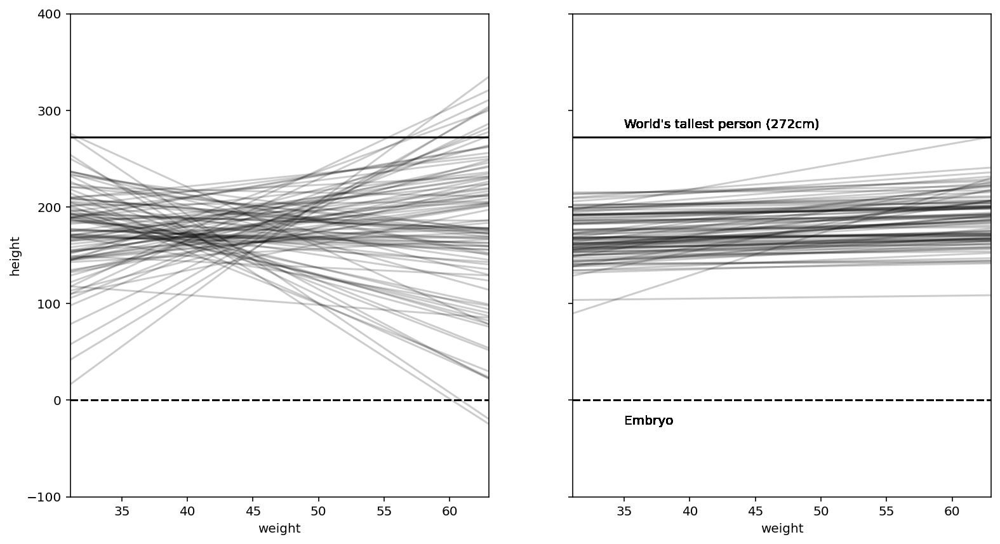

In [64]:
_, ax = plt.subplots(1, 2, sharey=True, figsize=(13, 7))
xbar = d2.weight.mean()
for i in range(N):
    ax[0].plot(a[i] + b[i] * (x - xbar), "k", alpha=0.2)
    ax[0].set_xlim(d2.weight.min(), d2.weight.max())
    ax[0].set_ylim(-100, 400)
    ax[0].axhline(0, c="k", ls="--")
    ax[0].axhline(272, c="k")
    ax[0].set_xlabel("weight")
    ax[0].set_ylabel("height")

b = stats.lognorm.rvs(s=1, scale=1, size=100)
for i in range(N):
    ax[1].plot(a[i] + b[i] * (x - xbar), "k", alpha=0.2)
    ax[1].set_xlim(d2.weight.min(), d2.weight.max())
    ax[1].set_ylim(-100, 400)
    ax[1].axhline(0, c="k", ls="--", label="embryo")
    ax[1].axhline(272, c="k")
    ax[1].set_xlabel("weight")
    ax[1].text(x=35, y=282, s="World's tallest person (272cm)")
    ax[1].text(x=35, y=-25, s="Embryo")
    
plt.show()

### Code 4.42

In [65]:
# load data again, since it's a long way back
d = pd.read_csv('../data/Howell1.csv', sep=';')
d2 = d[d['age'] >= 18].reset_index(drop=True)

# define the average weight, x-bar
xbar = d2['weight'].mean()

# fit model
with pm.Model() as model_4_3:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    
    mu = a + b * (d2['weight'] - xbar)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    
    trace_4_3 = pm.sample(10000, tune=1000)

<ipython-input-65-37f6441e234f>:18: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_3 = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 17 seconds.


### Code 4.43

In [66]:
with pm.Model() as model_4_3b:
    a = pm.Normal('a', mu=178, sigma=20)
    log_b = pm.Normal('b', mu=0, sigma=1)
    
    mu = a + np.exp(log_b) * (d2['weight'] - xbar)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    
    trace_4_3b = pm.sample(10000, tune=1000)    

<ipython-input-66-b5846b641ddb>:10: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_3b = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.


### Code 4.44

In [67]:
az.summary(trace_4_3, var_names=['a', 'b', 'sigma'], hdi_prob=.89, kind='stats')

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,154.602,0.274,154.153,155.020
b,0.903,0.042,0.836,0.970
sigma,5.104,0.198,4.783,5.408


### Code 4.45

In [68]:
pm.trace_to_dataframe(trace_4_3).cov().round(3)

,a,b,sigma
a,0.075,0.000,0.001
b,0.000,0.002,-0.000
sigma,0.001,-0.000,0.039


### Code 4.46

In [69]:
xgrid = np.linspace(d2['weight'].min(), d2['weight'].max(), 100)
line = trace_4_3['a'].mean() + trace_4_3['b'].mean() * (xgrid - xbar)

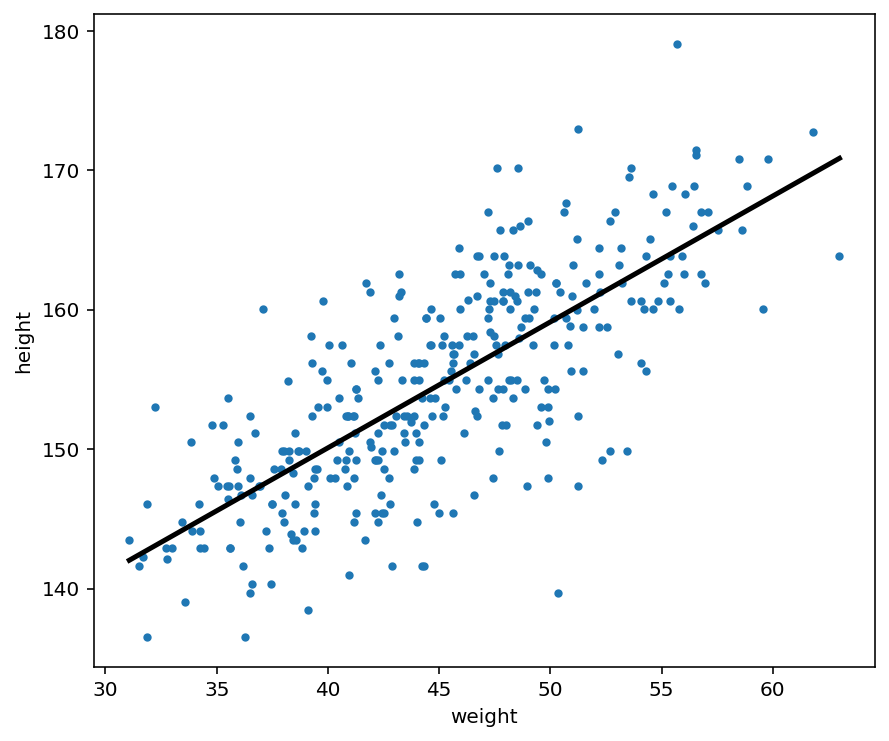

In [70]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.scatter(d2['weight'], d2['height'], s=10)
ax.plot(xgrid, line, color='black', linewidth=2.5)
ax.set_xlabel('weight')
ax.set_ylabel('height')

plt.show()

### Code 4.47

In [71]:
dN = d2.head(10)

### Code 4.48

In [72]:
# fit model
with pm.Model() as model_N:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    
    mu = a + b * (dN['weight'] - dN['weight'].mean())
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=dN['height'])
    
    trace_N = pm.sample(10000, tune=1000)

<ipython-input-72-4a9dc1f4a1f0>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_N = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.


In [73]:
trace_N_df = pm.trace_to_dataframe(trace_N)

### Code 4.49

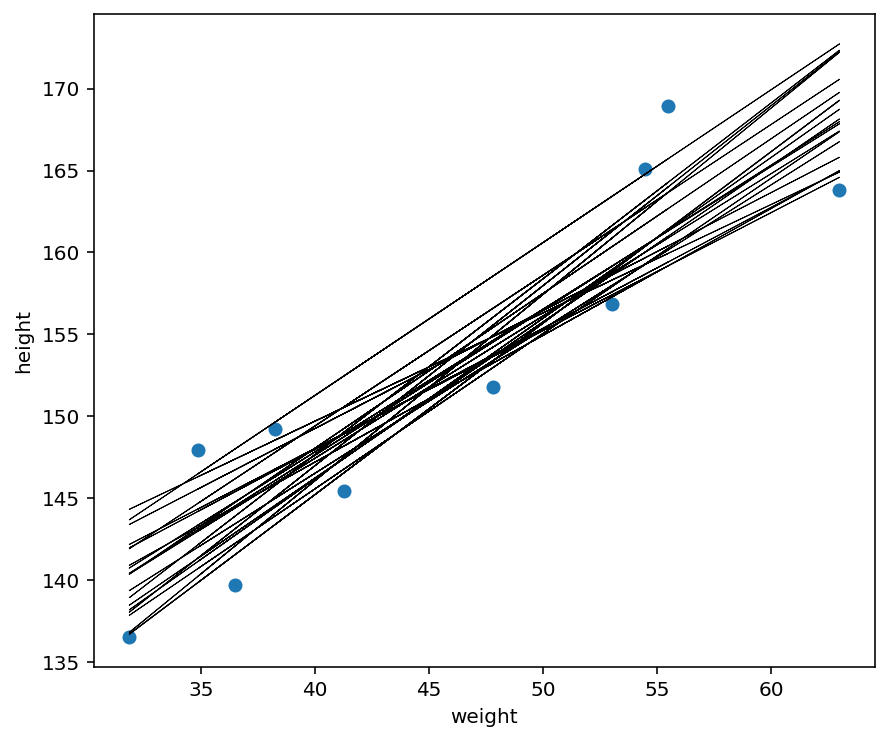

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))
ax.scatter(dN['weight'], dN['height'])
for _, row in trace_N_df.head(20).iterrows():
    ax.plot(dN['weight'],
            row['a'] + row['b'] * (dN['weight'] - dN['weight'].mean()),
            c='black', linewidth=.5)
    
ax.set_ylabel('height')
ax.set_xlabel('weight')
plt.show()

<ipython-input-75-f432bd04b038>:17: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_N = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
<ipython-input-75-f432bd04b038>:17: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_N = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.
<ipython-input-75-f432bd04b038>:17: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_N = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
<ipython-input-75-f432bd04b038>:17: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_N = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.


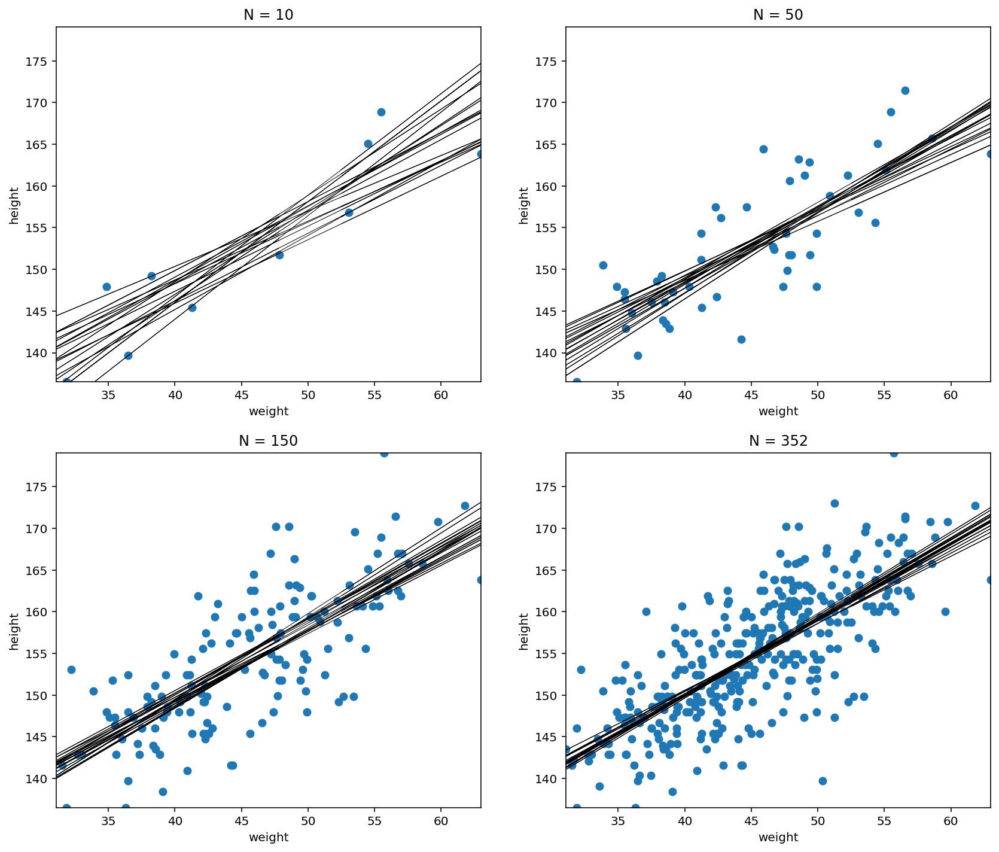

In [75]:
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.ravel()
Ns = [10, 50, 150, 352]

for i in range(4):
    N = Ns[i]
    dN = d2.head(N)
    with pm.Model() as model_N:
        a = pm.Normal('a', mu=178, sigma=20)
        b = pm.Lognormal('b', mu=0, sigma=1)

        mu = a + b * (dN['weight'] - dN['weight'].mean())
        sigma = pm.Uniform('sigma', lower=0, upper=50)

        height = pm.Normal('height', mu=mu, sigma=sigma, observed=dN['height'])

        trace_N = pm.sample(10000, tune=1000)
    trace_N_df = pm.trace_to_dataframe(trace_N)
    for _, row in trace_N_df.head(20).iterrows():
        axes[i].plot(d2['weight'],
                     row['a'] + row['b'] * (d2['weight'] - dN['weight'].mean()),
                     c='black', linewidth=.5)
    
    axes[i].scatter(dN['weight'], dN['height'])
    
    axes[i].set_ylabel('height')
    axes[i].set_xlabel('weight')
    axes[i].set_ylim(d2['height'].min(), d2['height'].max())
    axes[i].set_xlim(d2['weight'].min(), d2['weight'].max())
    axes[i].set_title(f'N = {N}')
    
plt.show()

### Code 4.50

In [76]:
mu_at_50 = trace_4_3['a'] + trace_4_3['b'] * (50 - d2['weight'].mean())

### Code 4.51

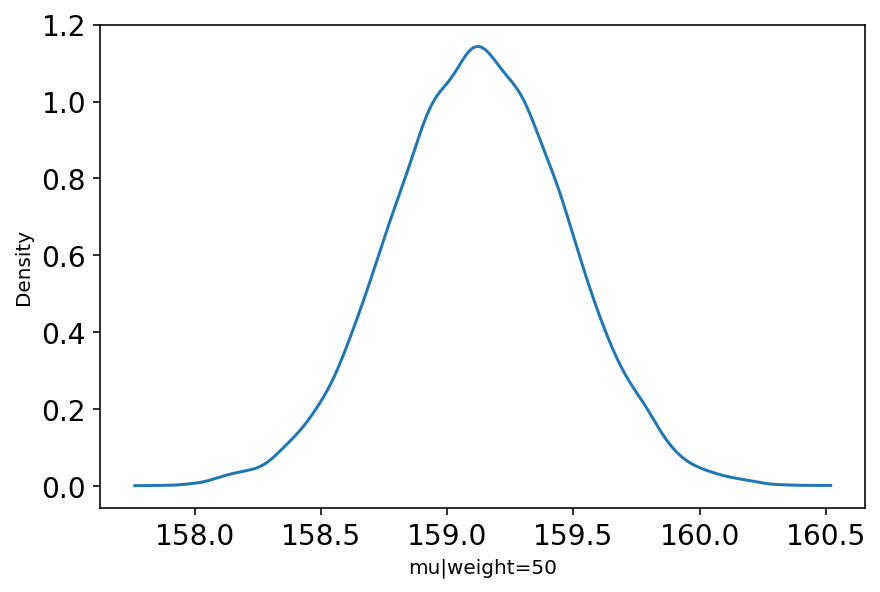

In [77]:
ax = az.plot_kde(mu_at_50)
ax.set_ylabel('Density')
ax.set_xlabel('mu|weight=50')
plt.show()

### Code 4.52

In [78]:
az.hdi(mu_at_50, hdi_prob=.89)

array([158.58273766, 159.69310267])

### Code 4.53

In [79]:
mu = []
xbar = d2['weight'].mean()
for w in d2['weight'].values:
    mu.append(trace_4_3['a'] + trace_4_3['b'] * (w - xbar))
    
mu = np.array(mu).T

### Code 4.54

In [80]:
weight_grid = np.arange(25, 70)

In [81]:
mu = []
xbar = d2['weight'].mean()
for w in weight_grid:
    mu.append(trace_4_3['a'] + trace_4_3['b'] * (w - xbar))
    
mu = np.array(mu).T

In [82]:
mu

array([[136.87669182, 137.77290074, 138.66910966, ..., 174.51746637,
        175.41367529, 176.30988421],
       [135.6109987 , 136.5720307 , 137.53306269, ..., 175.9743425 ,
        176.9353745 , 177.89640649],
       [137.33457939, 138.1805954 , 139.0266114 , ..., 172.86725168,
        173.71326769, 174.55928369],
       ...,
       [136.50004264, 137.3638587 , 138.22767476, ..., 172.78031722,
        173.64413328, 174.50794934],
       [137.23282806, 138.08243884, 138.93204963, ..., 172.91648093,
        173.76609171, 174.61570249],
       [136.20346733, 137.13106799, 138.05866864, ..., 175.16269494,
        176.0902956 , 177.01789626]])

### Code 4.55

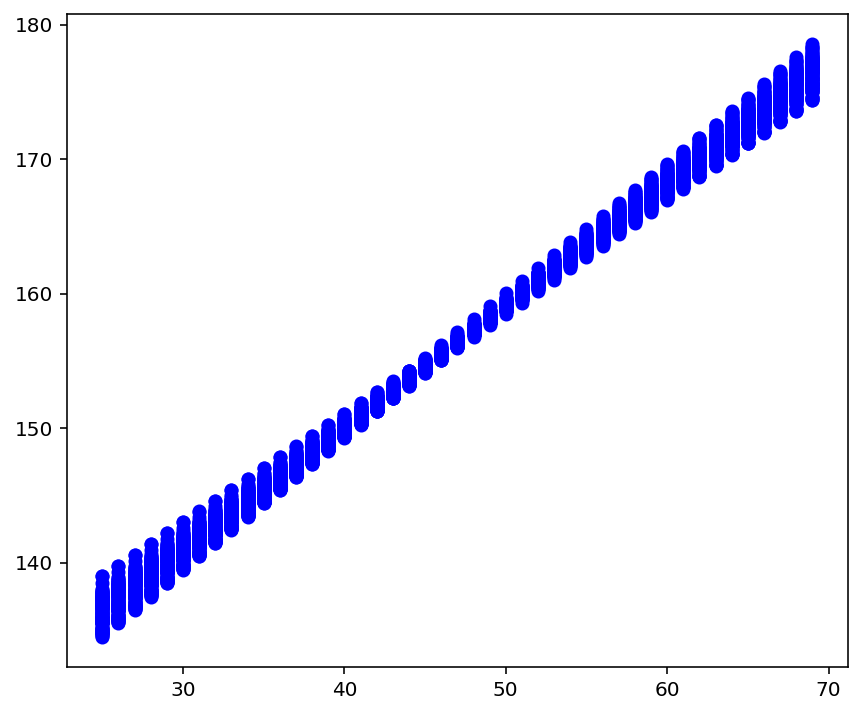

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))
for i in range(100):
    ax.scatter(weight_grid, mu[i, :], color='blue')
plt.show()

In [84]:
mu.shape

(20000, 45)

### Code 4.56

In [85]:
mu_mean = mu.mean(axis=0)
mu_pi = np.array([az.hdi(mu[:, i], hdi_prob=.89) for i in range(mu.shape[1])])

### Code 4.57

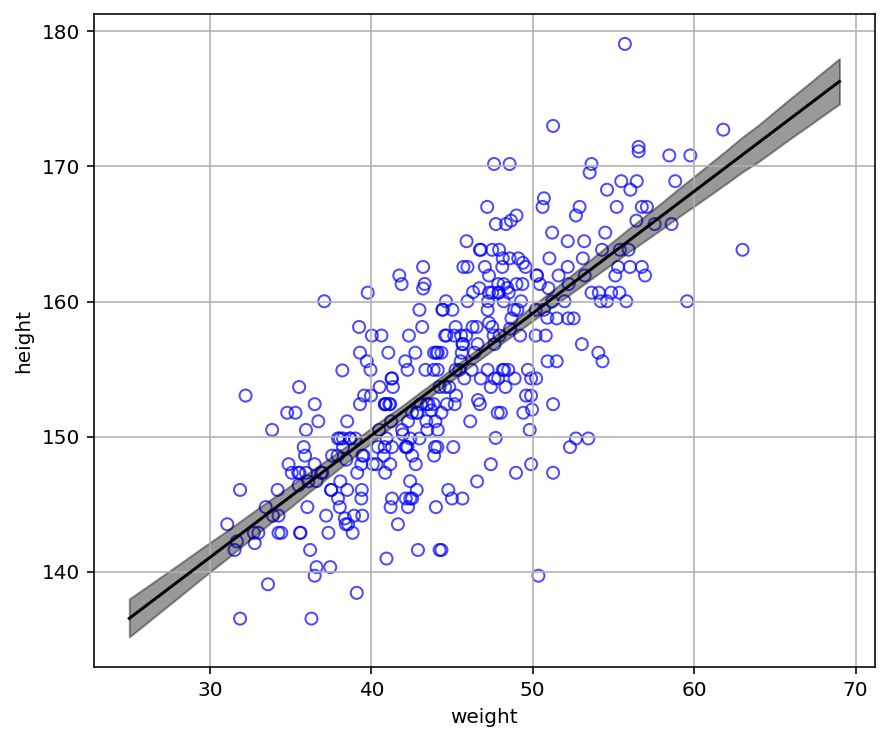

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.scatter(d2['weight'], d2['height'], marker='o', facecolors='none', edgecolors='blue', alpha=.7)
ax.plot(weight_grid, mu_mean, c='black')
ax.fill_between(weight_grid, mu_pi[:, 0], mu_pi[:, 1], color='black', alpha=.4)
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.grid()
plt.show()

### Code 4.59

In [87]:
sim_height = []
for w in weight_grid:
    mu = trace_4_3['a'] + trace_4_3['b'] * (w - xbar)
    sh = stats.norm(loc=mu, scale=trace_4_3['sigma']).rvs()
    sim_height.append(sh)
sim_height = np.array(sim_height).T

### Code 4.60

In [88]:
height_pi_67 = az.hdi(sim_height, hdi_prob=.67)
height_pi_89 = az.hdi(sim_height, hdi_prob=.89)
height_pi_97 = az.hdi(sim_height, hdi_prob=.97)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


### Code 4.61

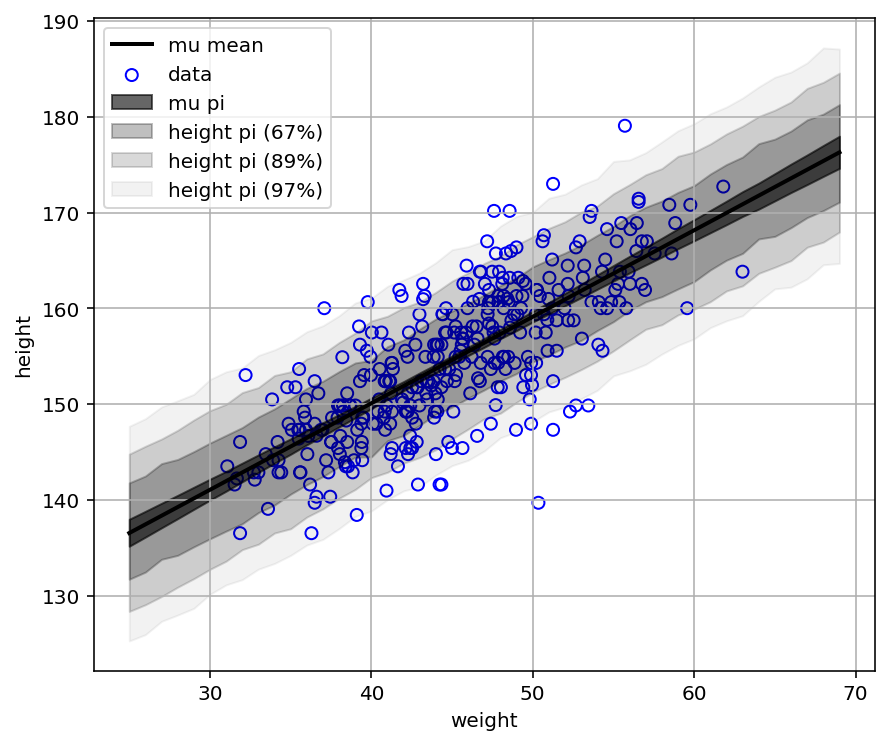

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))
ax.scatter(d2['weight'], d2['height'], facecolors='none', edgecolors='blue', label='data')
ax.plot(weight_grid, mu_mean, color='black', linewidth=2, label='mu mean')
ax.fill_between(weight_grid, mu_pi[:, 0], mu_pi[:, 1], color='black', alpha=.6, label='mu pi')
ax.fill_between(weight_grid, height_pi_67[:, 0], height_pi_67[:, 1], color='black', alpha=.25, label='height pi (67%)')
ax.fill_between(weight_grid, height_pi_89[:, 0], height_pi_89[:, 1], color='black', alpha=.15, label='height pi (89%)')
ax.fill_between(weight_grid, height_pi_97[:, 0], height_pi_97[:, 1], color='black', alpha=.05, label='height pi (97%)')
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.grid()
ax.legend()
plt.show()

### Code 4.64

In [90]:
d = pd.read_csv('../data/Howell1.csv', sep=';')
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041914,41.0,1
4,145.415,41.276872,51.0,0


<AxesSubplot:xlabel='weight', ylabel='height'>

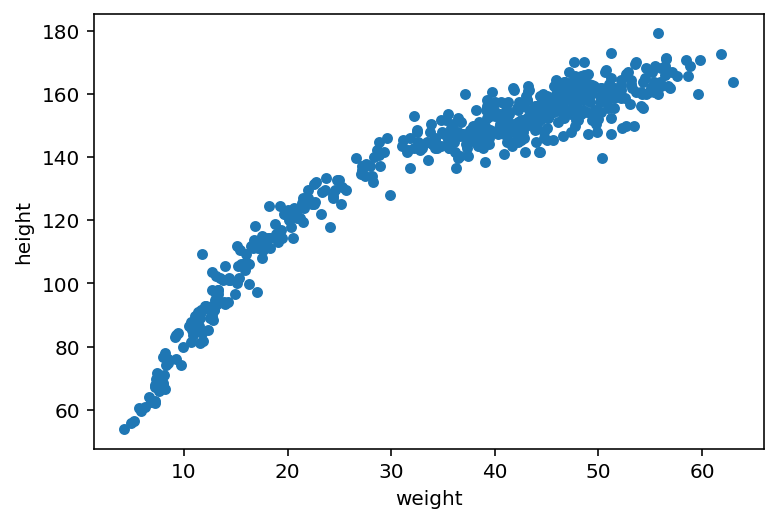

In [91]:
d.plot('weight', 'height', kind='scatter')

### Code 4.65

In [92]:
d['weight_s'] = (d['weight'] - d['weight'].mean()) / d['weight'].std()
d['weight_s2'] = d['weight_s'] ** 2

In [93]:
with pm.Model() as model_4_5:
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    a = pm.Normal('a', mu=178, sigma=20)
    b1 = pm.Lognormal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    
    mu = a + b1*d['weight_s'] + b2*d['weight_s2']
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d['height'])
    
    trace_4_5 = pm.sample(10000, tune=1000)

<ipython-input-93-90b8cbdbd82a>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_5 = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b2, b1, a, sigma]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 19 seconds.


In [94]:
az.summary(trace_4_5, hdi_prob=.89, kind='stats').sort_index()

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,146.050,0.378,145.435,146.638
b1,21.738,0.296,21.268,22.206
b2,-7.796,0.282,-8.233,-7.332
sigma,5.805,0.180,5.512,6.080


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


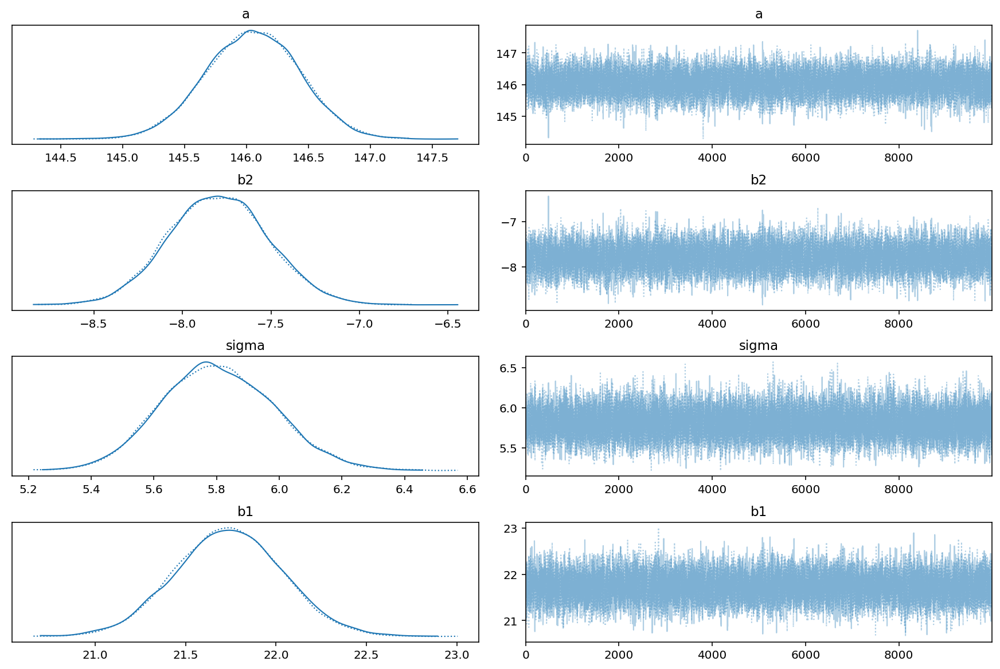

In [95]:
az.plot_trace(trace_4_5)
plt.show()

### Code 4.67

In [96]:
weight_grid = np.linspace(d['weight_s'].min(), d['weight_s'].max(), 30)
pred_dat = pd.DataFrame({'weight_s': weight_grid, 'weight_s2': weight_grid**2})

In [97]:
mu = []
sim_height = []
for _, row in pred_dat.iterrows():
    mu_point = trace_4_5['a'] + trace_4_5['b1']*row['weight_s'] + trace_4_5['b2']*row['weight_s2']
    height_point = stats.norm(mu_point, trace_4_5['sigma']).rvs()
    mu.append(mu_point)
    sim_height.append(height_point)
    
mu = np.array(mu).T
sim_height = np.array(sim_height).T

In [98]:
mu_mean = mu.mean(axis=0)
mu_pi = az.hdi(mu, hdi_prob=.89)
height_pi = az.hdi(sim_height, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


### Code 4.68

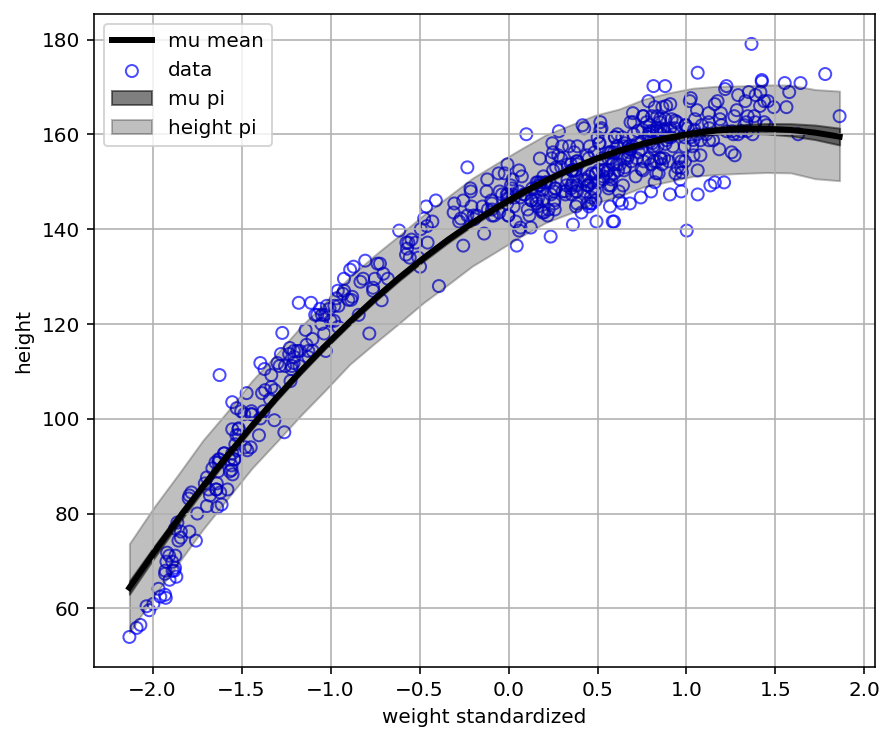

In [99]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.scatter(d['weight_s'], d['height'], marker='o', facecolors='none', edgecolors='blue', label='data', alpha=.7)
ax.plot(weight_grid, mu_mean, color='black', linewidth=3, label='mu mean')
ax.fill_between(weight_grid, mu_pi[:, 0], mu_pi[:, 1], color='black', alpha=.5, label='mu pi')
ax.fill_between(weight_grid, height_pi[:, 0], height_pi[:, 1], color='black', alpha=.25, label='height pi')
ax.grid()
ax.legend()
ax.set_xlabel('weight standardized')
ax.set_ylabel('height')

plt.show()

### Code 4.71

In [100]:
d['weight_s3'] = d['weight_s'] ** 3

In [101]:
with pm.Model() as model_4_6:
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    a = pm.Normal('a', mu=178, sigma=20)
    b1 = pm.Lognormal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    b3 = pm.Normal('b3', mu=0, sigma=1)
    
    mu = a + b1*d['weight_s'] + b2*d['weight_s2'] + b3*d['weight_s3']
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d['height'])
    
    trace_4_6 = pm.sample(10000, tune=1000)    

<ipython-input-101-3b3c3b76defb>:12: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_6 = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b3, b2, b1, a, sigma]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 36 seconds.


In [102]:
weight_grid = np.linspace(d['weight_s'].min(), d['weight_s'].max(), 30)
pred_dat = pd.DataFrame({'weight_s': weight_grid,
                         'weight_s2': weight_grid**2,
                         'weight_s3': weight_grid**3})

In [103]:
mu = []
sim_height = []
for _, row in pred_dat.iterrows():
    mu_point = trace_4_6['a'] + \
        trace_4_6['b1']*row['weight_s'] + \
        trace_4_6['b2']*row['weight_s2'] + \
        trace_4_6['b3']*row['weight_s3']
    height_point = stats.norm(mu_point, trace_4_6['sigma']).rvs()
    mu.append(mu_point)
    sim_height.append(height_point)
    
mu = np.array(mu).T
sim_height = np.array(sim_height).T

In [104]:
mu_mean = mu.mean(axis=0)
mu_pi = az.hdi(mu, hdi_prob=.89)
height_pi = az.hdi(sim_height, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


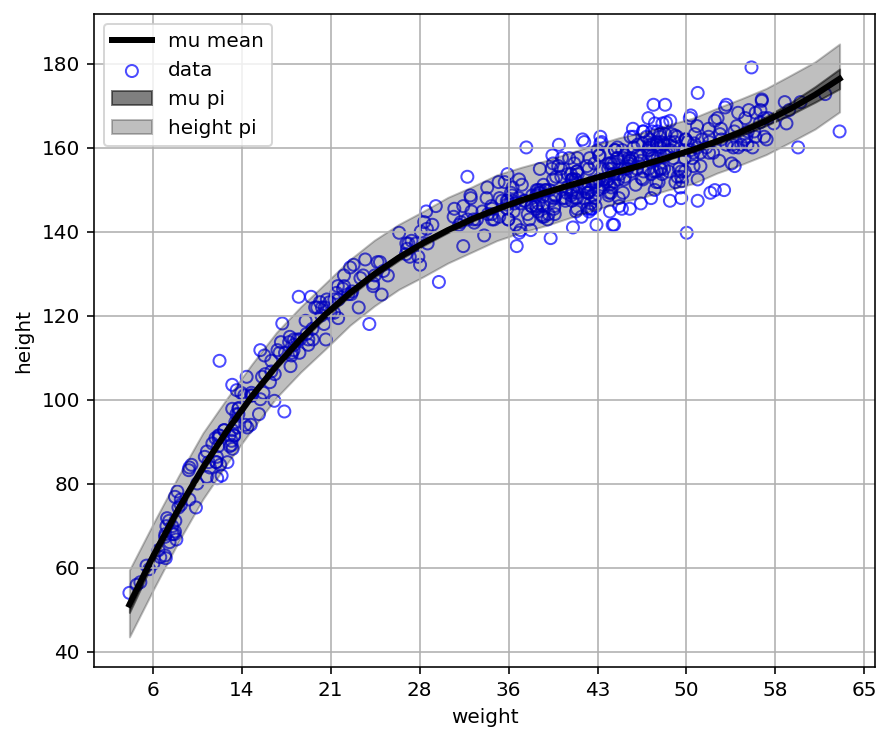

In [105]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.scatter(d['weight_s'], d['height'], marker='o', facecolors='none', edgecolors='blue', label='data', alpha=.7)
ax.plot(weight_grid, mu_mean, color='black', linewidth=3, label='mu mean')
ax.fill_between(weight_grid, mu_pi[:, 0], mu_pi[:, 1], color='black', alpha=.5, label='mu pi')
ax.fill_between(weight_grid, height_pi[:, 0], height_pi[:, 1], color='black', alpha=.25, label='height pi')
ax.grid()
ax.legend()
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.xaxis.set_major_formatter(lambda x, _: '{:.0f}'.format((x * d['weight'].std()) + d['weight'].mean()))

plt.show()

### Code 4.72

In [106]:
d = pd.read_csv('../data/cherry_blossoms.csv')

In [107]:
d.head()

,year,doy,temp,temp_upper,temp_lower
0,801,NaN,NaN,NaN,NaN
1,802,NaN,NaN,NaN,NaN
2,803,NaN,NaN,NaN,NaN
3,804,NaN,NaN,NaN,NaN
4,805,NaN,NaN,NaN,NaN


In [108]:
d.describe()

,year,doy,temp,temp_upper,temp_lower
count,1215.000000,827.000000,1124.000000,1124.000000,1124.000000
mean,1408.000000,104.540508,6.141886,7.185151,5.098941
std,350.884596,6.407036,0.663648,0.992921,0.850350
min,801.000000,86.000000,4.670000,5.450000,0.750000
25%,1104.500000,100.000000,5.700000,6.480000,4.610000
50%,1408.000000,105.000000,6.100000,7.040000,5.145000
75%,1711.500000,109.000000,6.530000,7.720000,5.542500
max,2015.000000,124.000000,8.300000,12.100000,7.740000


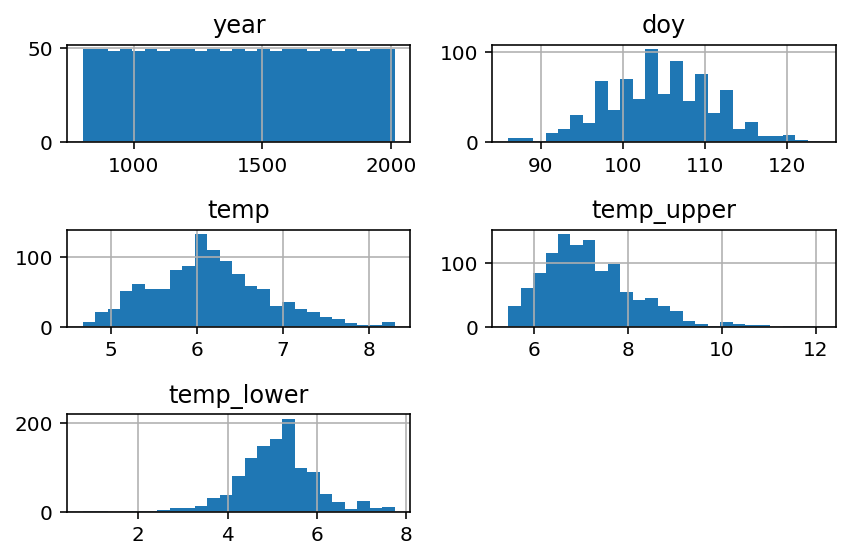

In [109]:
d.hist(bins=25)
plt.tight_layout()
plt.show()

### Code 4.73

In [110]:
d2 = d[d['doy'].notna()].reset_index(drop=True)
num_knots = 15
knot_list = np.quantile(d2['year'], q=np.linspace(0, 1, num_knots))

In [111]:
knot_list

array([ 812., 1036., 1174., 1269., 1377., 1454., 1518., 1583., 1650.,
       1714., 1774., 1833., 1893., 1956., 2015.])

### Code 4.74

In [112]:
from patsy import bs

B = bs(d2['year'], knots=knot_list[1:-1], degree=3, include_intercept=True).values

In [113]:
B.shape

(827, 17)

### Code 4.75

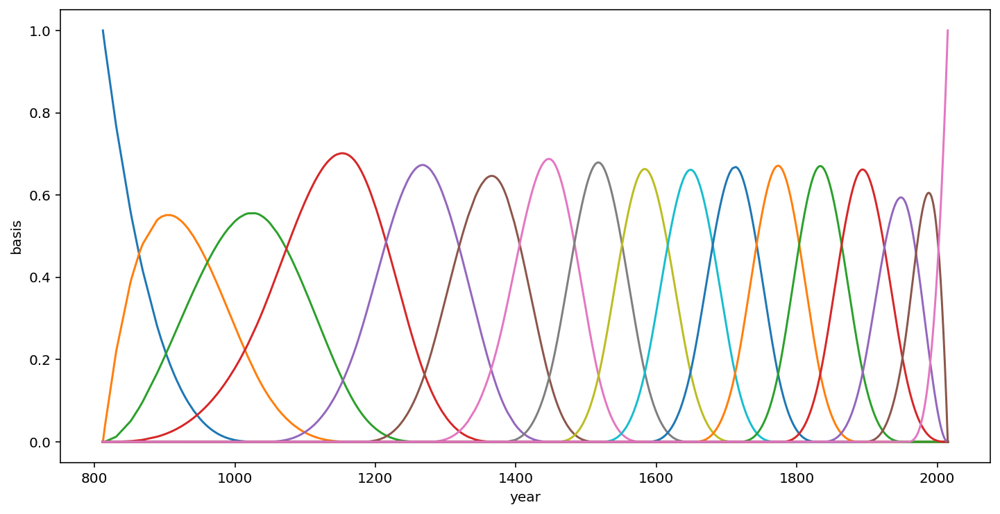

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))

for i in range(B.shape[1]):
    ax.plot(d2.year, (B[:, i]))
ax.set_xlabel("year")
ax.set_ylabel("basis");

plt.show()

### Code 4.76

In [115]:
with pm.Model() as model_4_7:
    a = pm.Normal('a', mu=100, sigma=10)
    sigma = pm.Exponential('sigma', lam=1)
    w = pm.Normal('w', mu=0, sigma=10, shape=B.shape[1])
    mu = pm.Deterministic('mu', a + pm.math.dot(B, w.T))
    D = pm.Normal('D', mu=mu, sigma=sigma, observed=d2['doy'])
    trace_4_7 = pm.sample(5000, tune=10000)

<ipython-input-115-a6a6d8e60d1f>:7: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_4_7 = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 83 seconds.
There were 2559 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6071817868497419, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 10% for some parameters.


In [116]:
az.summary(trace_4_7, var_names=['a', 'sigma'], hdi_prob=.89, kind='stats')

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
a,103.108,2.302,99.141,106.448
sigma,5.947,0.143,5.709,6.167


In [117]:
az.summary(trace_4_7, var_names=['w'], hdi_prob=.89, kind='stats')

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
w[0],-2.774,3.731,-8.573,3.339
w[1],-0.662,3.821,-6.427,5.702
w[2],-0.748,3.498,-6.167,5.149
w[3],5.090,2.837,0.599,9.495
w[4],-0.651,2.818,-5.064,3.902
w[5],4.614,2.881,-0.084,9.039
w[6],-5.134,2.723,-9.136,-0.507
w[7],8.111,2.817,3.772,12.742
w[8],-0.782,2.808,-5.415,3.454
w[9],3.262,2.908,-1.589,7.628


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'a'}>,
        <AxesSubplot:title={'center':'a'}>],
       [<AxesSubplot:title={'center':'sigma'}>,
        <AxesSubplot:title={'center':'sigma'}>]], dtype=object)

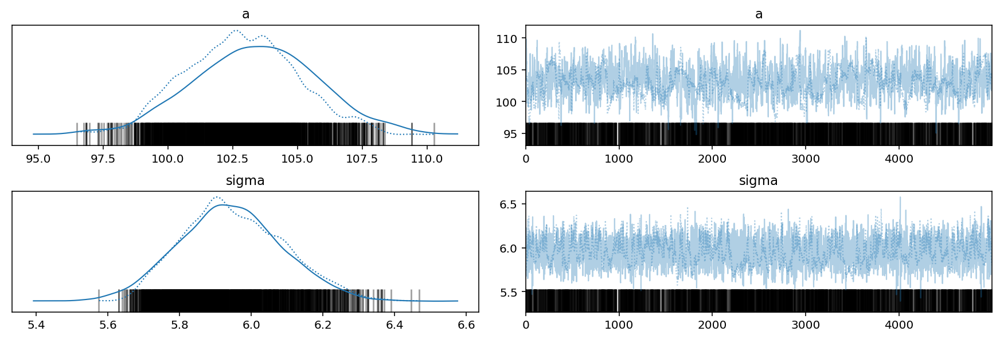

In [118]:
az.plot_trace(trace_4_7, var_names=['a', 'sigma'])

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


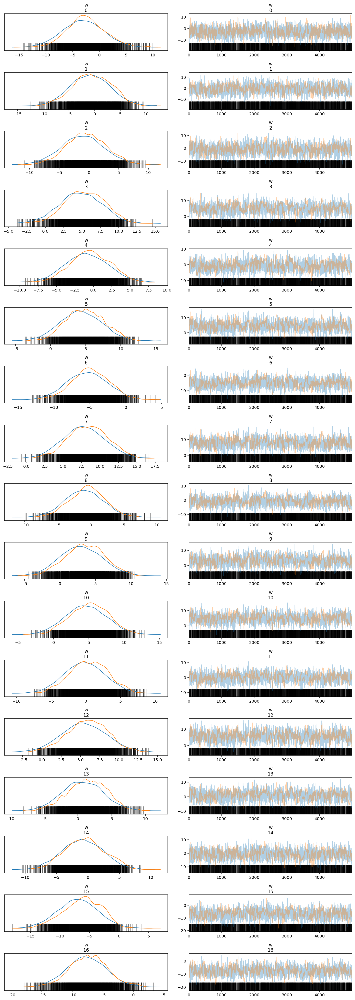

In [119]:
az.plot_trace(trace_4_7, var_names=['w'], compact=False)
plt.show()

### Code 4.77

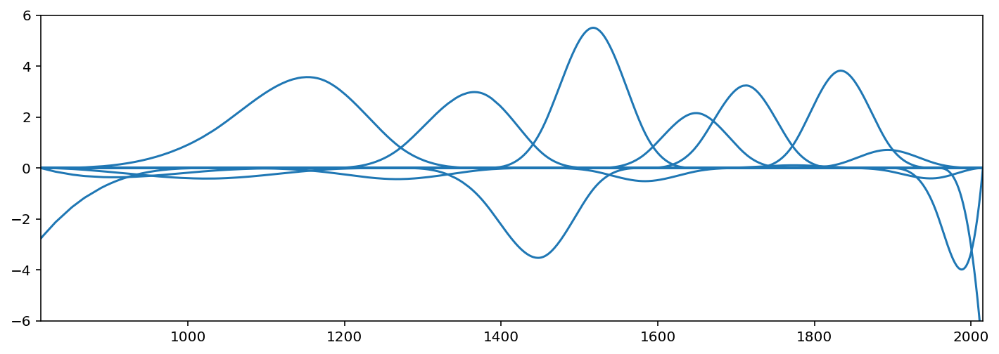

In [120]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
wp = trace_4_7[w].mean(0)
for i in range(17):
    ax.plot(d2.year, (wp[i] * B[:, i]), color="C0")
ax.set_xlim(812, 2015)
ax.set_ylim(-6, 6);

### Code 4.78

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


Text(0, 0.5, 'days in year')

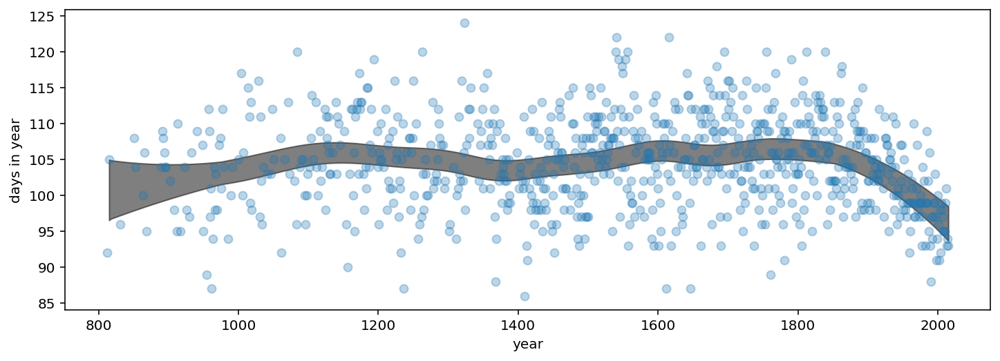

In [121]:
fig, ax = plt.subplots(figsize=(12, 4))
az.plot_hdi(d2.year, trace_4_7["mu"], color="k", ax=ax)
ax.plot(d2.year, d2.doy, "o", alpha=0.3)
ax.set_xlabel("year")
ax.set_ylabel("days in year")

## Practices

### 4E1.
In the model definition below, which line is the likelihood?

$$
y_{i} ∼ Normal(\mu, \sigma) \\
\mu ∼ Normal(0, 10) \\
\sigma ∼ Exponential(1) \\
$$

**Answer:** The first line is the likelihood

### 4E2.
In the model definition just above, how many parameters are in the posterior distribution?

**Answer:**
There are 2 parameters in the posterior distribution. $\mu$ and $\sigma$

### 4E4. 

In the model definition below, which line is the linear model?

$$
y_{i} ∼ Normal(\mu, \sigma)\\
\mu_{i} = \alpha + \beta x_{i} \\
\alpha ∼ Normal(0, 10) \\
\beta ∼ Normal(0, 1) \\
\sigma ∼ Exponential(2) \\
$$

**Answer:** The second line

### 4E5.
In the model definition just above, how many parameters are in the posterior distribution?
**Answer:** 2+i

### 4M1.

For the model definition below, simulate observed y values from the prior (not the posterior).

$$
y_{i} ∼ Normal(µ, σ) \\
µ ∼ Normal(0, 10) \\
σ ∼ Exponential(1)
$$ 

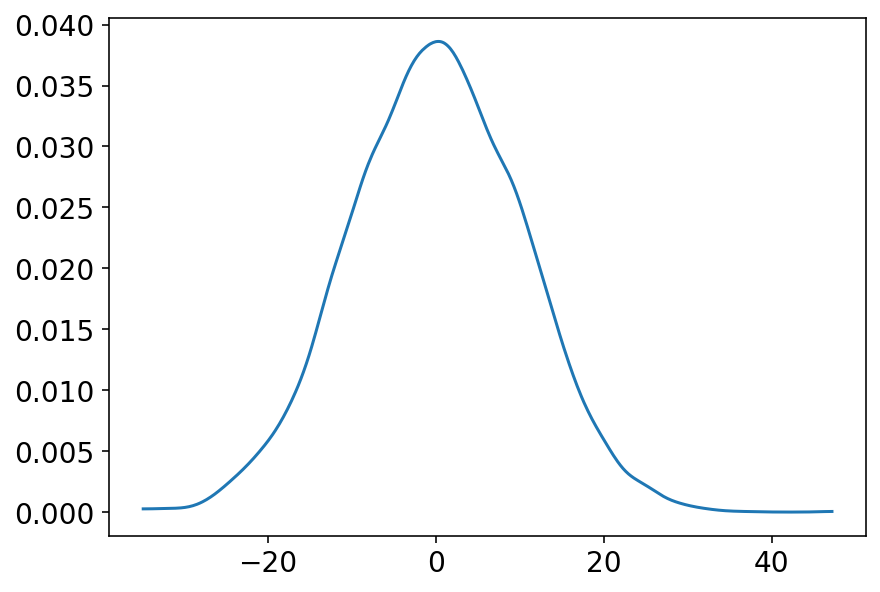

In [122]:
N = 10_000

μ = stats.norm(0, 10).rvs(N)
σ = stats.expon(1).rvs(N)
yi = stats.norm(μ, σ).rvs()

az.plot_kde(yi)
plt.show()

### 4M2.

Translate the model just above into a quap formula.

In [123]:
with pm.Model() as model:
    μ = pm.Normal('μ', 0, 10)
    σ = pm.Exponential('σ', 1)
    yi = pm.Normal('yi', μ, σ)

### 4M3.

Translate the quap model formula below into a mathematical model definition.

```R
y ~ dnorm( mu , sigma ),
mu <- a + b*x,
a ~ dnorm( 0 , 10 ),
b ~ dunif( 0 , 1 ),
sigma ~ dexp( 1 )
```

**Answer:**

$$
y_{i} \sim Normal(\mu, \sigma) \\
\mu = \alpha + \beta \times x \\
\alpha \sim Normal(0, 10) \\
\beta \sim Uniform(0, 1) \\
\sigma \sim Exponential(1)
$$ 

### 4M4. 

A sample of students is measured for height each year for 3 years. After the third year, you want to fit a linear regression predicting height using year as a predictor. Write down the mathematical model definition for this regression, using any variable names and priors you choose. Be prepared to defend your choice of priors

**Answer:**

$$
y_{i} \sim Normal(\mu, \sigma) \\
\mu = \alpha + \beta \times x \\
\alpha \sim Normal(100, 20) \\
\beta \sim LogNormal(0, 1) \\
\sigma \sim Exponential(1)
$$

### 4M5.
Now suppose I remind you that every student got taller each year. Does this information lead you to change your choice of priors? How?

**Answer:** No, I already considered this fact when choosing the prior. That is why I used a LogNormal prior for the $\beta$ parameter

### 4M6.
Now suppose I tell you that the variance among heights for students of the same age is never more than 64cm. How does this lead you to revise your priors?

**Answer:** I might increase the range of the $\sigma$ parameter to accomodate this information

### 4M7. 

Refit model `m4.3` from the chapter, but omit the mean weight `xbar` this time. Compare the new model’s posterior to that of the original model. In particular, look at the covariance among the parameters. What is different? Then compare the posterior predictions of both models.

In [124]:
# load data again, since it's a long way back
d = pd.read_csv('../data/Howell1.csv', sep=';')
d2 = d[d['age'] >= 18].reset_index(drop=True)

# define the average weight, x-bar
xbar = d2['weight'].mean()

In [125]:
# fit model
with pm.Model() as model_with_xbar:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    mu = a + b * (d2['weight'] - xbar)
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    trace_with_xbar = pm.sample(10000, tune=1000)

<ipython-input-125-ae3ee45d3b7a>:8: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_with_xbar = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 22 seconds.


In [126]:
# fit model
with pm.Model() as model_without_xbar:
    a = pm.Normal('a', mu=178, sigma=20)
    b = pm.Lognormal('b', mu=0, sigma=1)
    mu = a + b * d2['weight']
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d2['height'])
    trace_without_xbar = pm.sample(10000, tune=1000)

<ipython-input-126-95e74b9ff4d1>:8: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_without_xbar = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b, a]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 38 seconds.


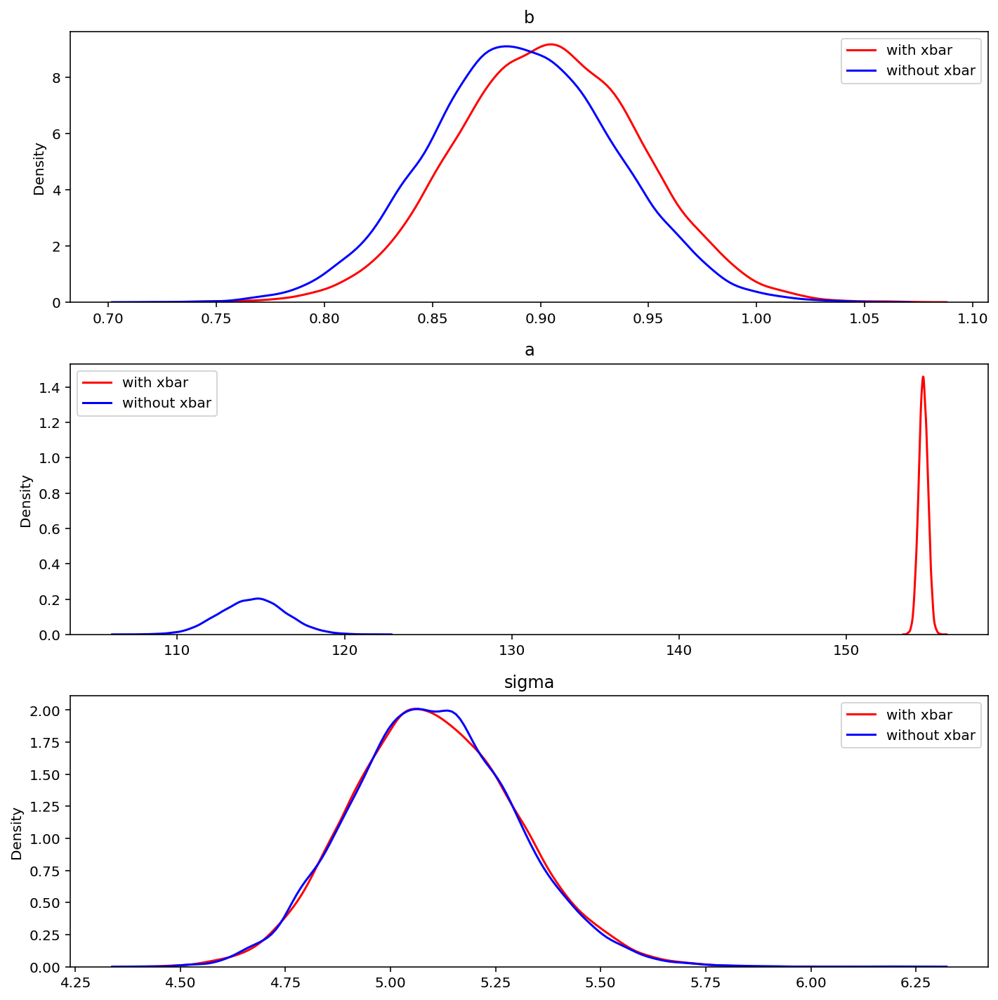

In [127]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10))

sns.kdeplot(trace_with_xbar['b'], ax=ax1, label='with xbar', color='red')
sns.kdeplot(trace_without_xbar['b'], ax=ax1, label='without xbar', color='blue')
ax1.legend()
ax1.set_title('b')

sns.kdeplot(trace_with_xbar['a'], ax=ax2, label='with xbar', color='red')
sns.kdeplot(trace_without_xbar['a'], ax=ax2, label='without xbar', color='blue')
ax2.legend()
ax2.set_title('a')

sns.kdeplot(trace_with_xbar['sigma'], ax=ax3, label='with xbar', color='red')
sns.kdeplot(trace_without_xbar['sigma'], ax=ax3, label='without xbar', color='blue')
ax3.legend()
ax3.set_title('sigma')

fig.tight_layout()
plt.show()

In [128]:
def predict_univariate(trace, weight_grid):
    mu = []

    for w in weight_grid:
        mux = trace['a'] + trace['b'] * w
        mu.append(mux)

    mu = np.array(mu).T
    return mu

mu_with_xbar = predict_univariate(trace_with_xbar, xgrid - xbar)
mu_without_xbar = predict_univariate(trace_without_xbar, xgrid)

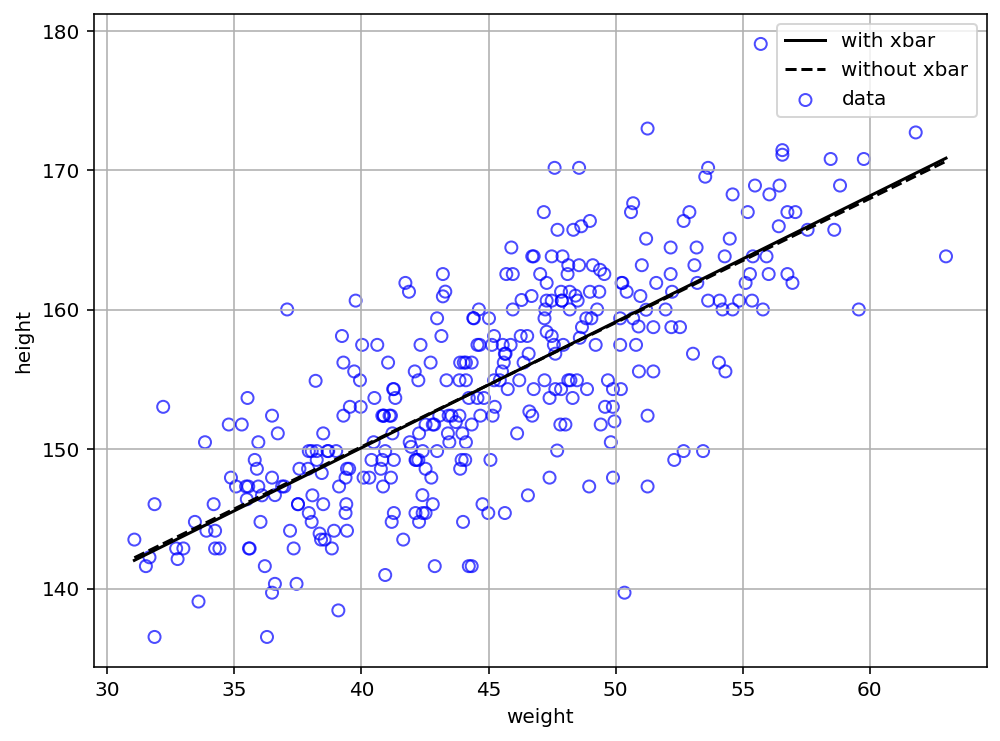

In [129]:
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(d2['weight'], d2['height'], facecolors='none', edgecolors='blue', alpha=.7, label='data')
ax.plot(xgrid, mu_with_xbar.mean(axis=0), label='with xbar', color='k')
ax.plot(xgrid, mu_without_xbar.mean(axis=0), label='without xbar', color='k', linestyle='--')
ax.grid()
ax.legend()
ax.set_xlabel('weight')
ax.set_ylabel('height')


plt.show()

The $\alpha$ parameter got much smaller, but othen than that, the results were very close

### 4M8. 

In the chapter, we used 15 knots with the cherry blossom spline. Increase the number of knots and observe what happens to the resulting spline. Then adjust also the width of the prior on the weights—change the standard deviation of the prior and watch what happens. What do you think the combination of knot number and the prior on the weights controls?

In [130]:
d = pd.read_csv('../data/cherry_blossoms.csv')

In [131]:
d2 = d[d['doy'].notna()].reset_index(drop=True)

In [132]:
def run_spline_regression(df: pd.DataFrame, num_knots: int):
    knot_list = np.quantile(df['year'], q=np.linspace(0, 1, num_knots))
    B = bs(df['year'], knots=knot_list[1:-1], degree=3, include_intercept=True).values
    
    with pm.Model() as model:
        a = pm.Normal('a', mu=100, sigma=10)
        sigma = pm.Exponential('sigma', lam=1)
        w = pm.Normal('w', mu=0, sigma=10, shape=B.shape[1])
        mu = pm.Deterministic('mu', a + pm.math.dot(B, w.T))
        D = pm.Normal('D', mu=mu, sigma=sigma, observed=df['doy'])
        trace = pm.sample(5000, tune=10000)
    
    return B, model, trace

In [133]:
num_knots_tries = [5, 10, 15, 20, 25]
results = []

for num_knots in num_knots_tries:
    result = run_spline_regression(d2, num_knots)
    results.append(result)

<ipython-input-132-a95399e53fbb>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 78 seconds.
The number of effective samples is smaller than 25% for some parameters.
<ipython-input-132-a95399e53fbb>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 82 seconds.
The number of effective samples is smaller than 25% for some parameters.
<ipython-input-132-a95399e53fbb>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 105 seconds.
The number of effective samples is smaller than 25% for some parameters.
<ipython-input-132-a95399e53fbb>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 84 seconds.
The number of effective samples is smaller than 25% for some parameters.
<ipython-input-132-a95399e53fbb>:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(5000, tune=10000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 10_000 tune and 5_000 draw iterations (20_000 + 10_000 draws total) took 91 seconds.
The number of effective samples is smaller than 25% for some parameters.


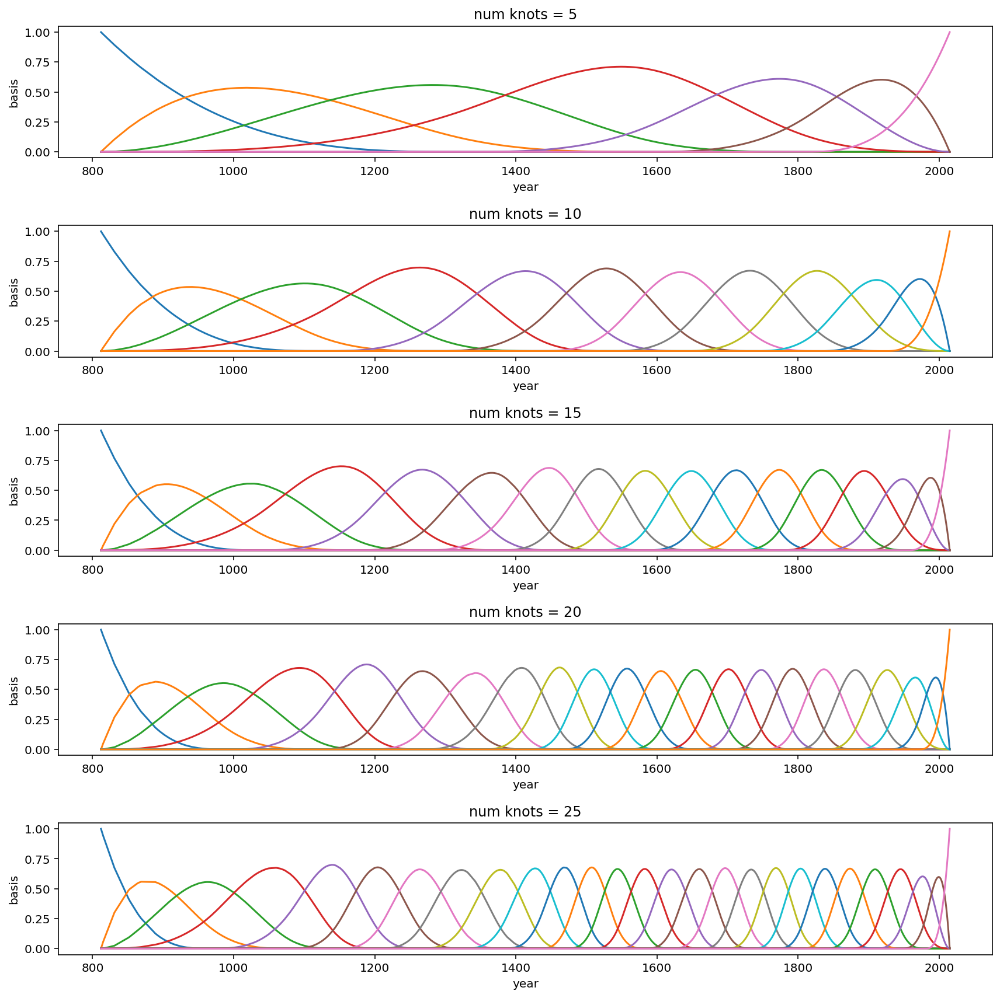

In [134]:
fig, axes = plt.subplots(len(num_knots_tries), figsize=(12, 12))

for num_knots, ax, (B, _, _) in zip(num_knots_tries, axes, results):
    for i in range(B.shape[1]):
        ax.plot(d2['year'], (B[:, i]))

    ax.set_xlabel("year")
    ax.set_ylabel("basis")
    ax.set_title(f'num knots = {num_knots}')
    
fig.tight_layout()
plt.show()

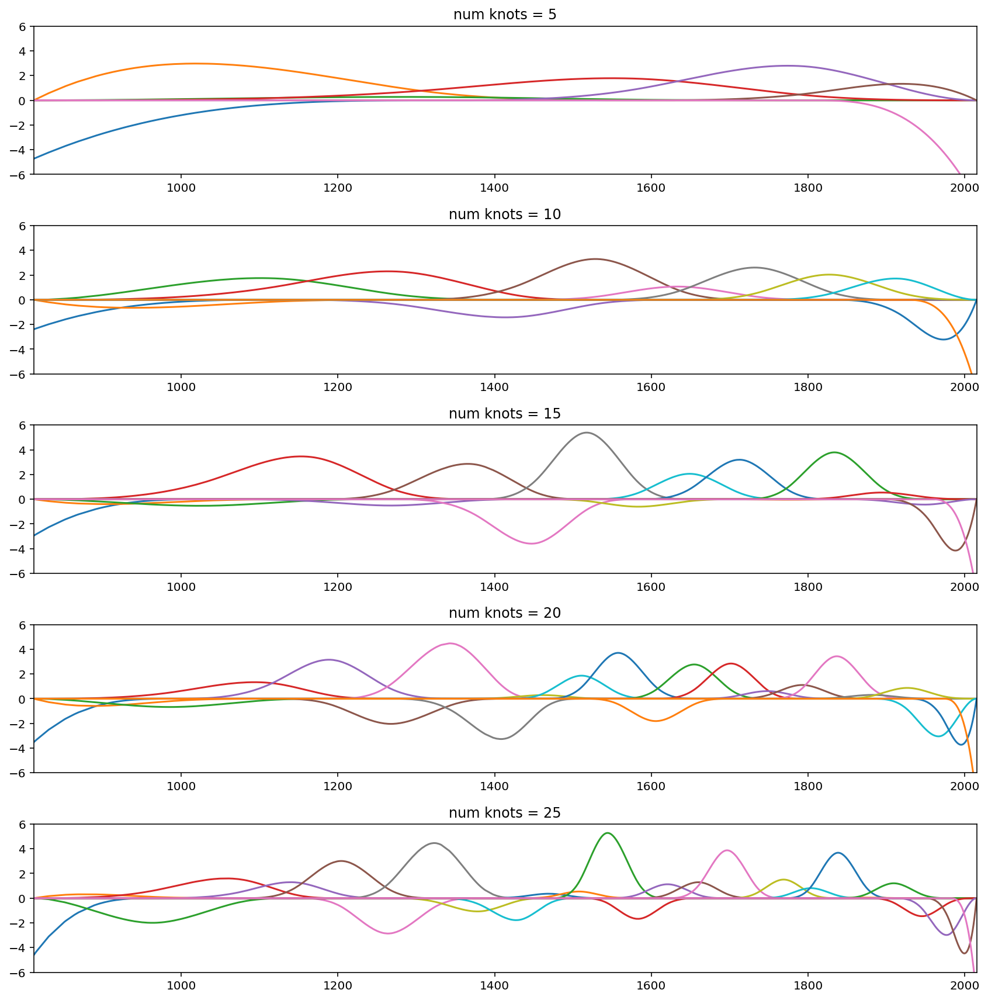

In [135]:
fig, axes = plt.subplots(len(num_knots_tries), figsize=(12, 12))

for num_knots, ax, (B, _, trace) in zip(num_knots_tries, axes, results):
    wp = trace['w'].mean(0)
    for i in range(B.shape[1]):
        ax.plot(d2['year'], (wp[i] * B[:, i]))

    ax.set_xlim(812, 2015)
    ax.set_ylim(-6, 6);
    ax.set_title(f'num knots = {num_knots}')
    
fig.tight_layout()
plt.show()

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/s

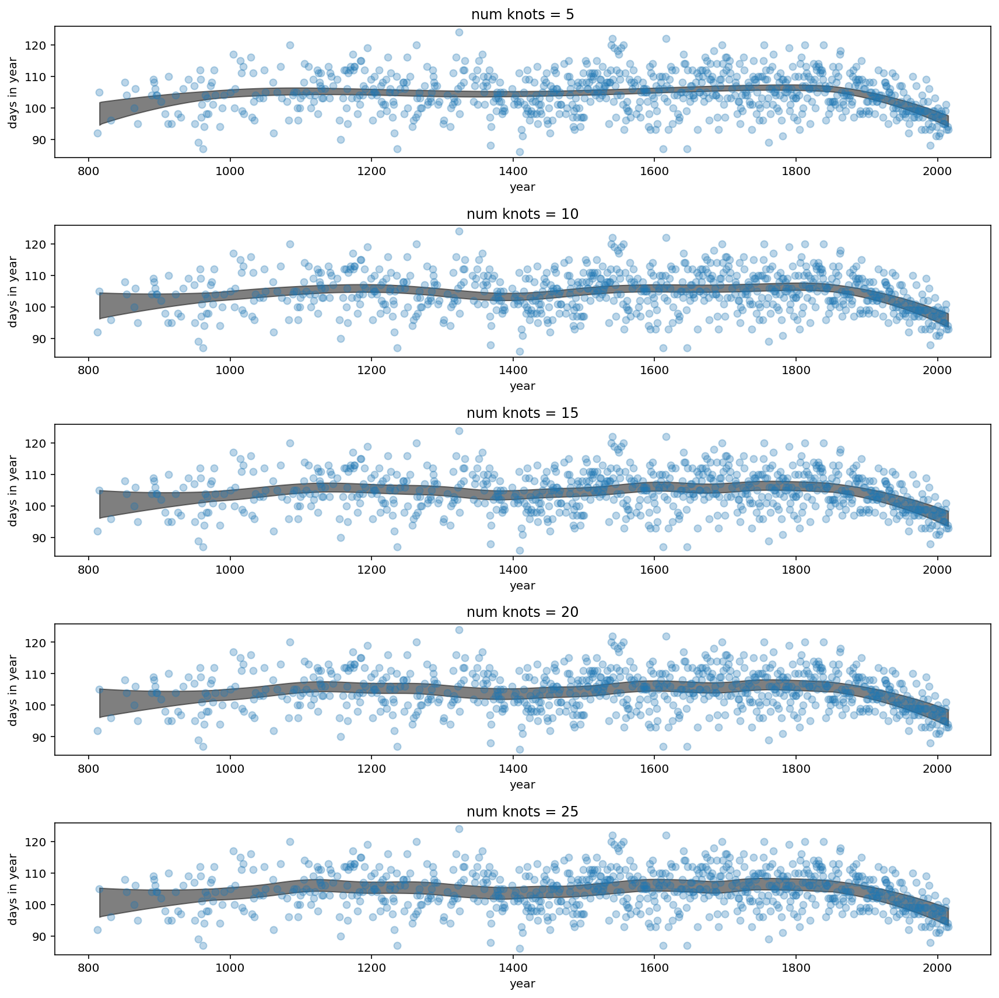

In [136]:
fig, axes = plt.subplots(len(num_knots_tries), figsize=(12, 12))

for num_knots, ax, (B, _, trace) in zip(num_knots_tries, axes, results):
    az.plot_hdi(d2['year'], trace["mu"], color="k", ax=ax)
    ax.plot(d2['year'], d2['doy'], "o", alpha=0.3)
    ax.set_xlabel("year")
    ax.set_ylabel("days in year")
    ax.set_title(f'num knots = {num_knots}')
    
fig.tight_layout()
plt.show()

### 4H1.

The weights listed below were recorded in the !Kung census, but heights were not recorded for these individuals. Provide predicted heights and 89% intervals for each of these individuals. That is, fill in the table below, using model-based predictions.


| Individual | Weight | Expected Height | 89% Interval |
|:----------:|:------:|:---------------:|:------------:|
|1           |46.95   |
|2           |43.72   |
|3           |64.78   |
|4           |32.59   |
|5           |54.63   |

In [137]:
not_rec = pd.DataFrame({'weight': [46.95, 43.72, 64.78, 32.59, 54.63]})

In [138]:
d = pd.read_csv('../data/Howell1.csv', sep=';')

In [139]:
d['weight_s'] = (d['weight'] - d['weight'].mean()) / d['weight'].std()
d['weight_s2'] = d['weight_s'] ** 2
d['weight_s3'] = d['weight_s'] ** 3

In [140]:
with pm.Model() as model:
    sigma = pm.Uniform('sigma', lower=0, upper=50)
    
    a = pm.Normal('a', mu=178, sigma=20)
    b1 = pm.Lognormal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    b3 = pm.Normal('b3', mu=0, sigma=1)
    
    mu = a + b1*d['weight_s'] + b2*d['weight_s2'] + b3*d['weight_s3']
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d['height'])
    
    trace = pm.sample(10000, tune=1000)    

<ipython-input-140-08d841d1923d>:12: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(10000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b3, b2, b1, a, sigma]


Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 38 seconds.


In [141]:
not_rec['weight_s'] = (not_rec['weight'] - d['weight'].mean()) / d['weight'].std()
not_rec['weight_s2'] = not_rec['weight_s'] ** 2
not_rec['weight_s3'] = not_rec['weight_s'] ** 3

In [142]:
not_rec['expected_height'] = np.NaN
not_rec['89_interval_lower'] = np.NaN
not_rec['89_interval_upper'] = np.NaN

In [143]:
for i, row in not_rec.iterrows():
    mu = trace['a'] + \
        trace['b1'] * row['weight_s'] + \
        trace['b2'] * row['weight_s2'] + \
        trace['b3'] * row['weight_s3']
    sim = stats.norm(mu, trace['sigma']).rvs()
    interval = az.hdi(sim, hdi_prob=.89)
    
    not_rec.loc[i, 'expected_height'] = mu.mean()
    not_rec.loc[i, '89_interval_lower'] = interval[0]
    not_rec.loc[i, '89_interval_upper'] = interval[1]

In [144]:
not_rec

,weight,weight_s,weight_s2,weight_s3,expected_height,89_interval_lower,89_interval_upper
0,46.95,0.770381,0.593488,0.457212,156.081430,148.226142,163.636129
1,43.72,0.550940,0.303535,0.167229,153.499007,145.470075,161.186958
2,64.78,1.981726,3.927239,7.782713,180.070983,171.793190,188.233833
3,32.59,-0.205216,0.042114,-0.008642,142.971407,135.135467,150.457115
4,54.63,1.292150,1.669651,2.157439,163.439596,155.783103,171.204124


### 4H2. 
Select out all the rows in the Howell1 data with ages below 18 years of age. If you do it right, you should end up with a new data frame with 192 rows in it.

**(a)** Fit a linear regression to these data, using quap. Present and interpret the estimates. For every 10 units of increase in weight, how much taller does the model predict a child gets?

**(b)** Plot the raw data, with height on the vertical axis and weight on the horizontal axis. Superimpose the MAP regression line and 89% interval for the mean. Also superimpose the 89% interval for predicted heights.

**(c)** What aspects of the model fit concern you? Describe the kinds of assumptions you would change, if any, to improve the model. You don’t have to write any new code. Just explain what the model appears to be doing a bad job of, and what you hypothesize would be a better model.

In [145]:
d = pd.read_csv('../data/Howell1.csv', sep=';')
d = d[d['age'] < 18].reset_index(drop=True)
len(d)

192

In [146]:
with pm.Model() as model:
    alpha = pm.Normal('alpha', d['weight'].mean(), 20)
    beta = pm.Lognormal('beta', 0, 1)
    sigma = pm.Exponential('sigma', 1)
    mu = alpha + beta * (d['weight'] - d['weight'].mean())
    height = pm.Normal('height', mu, sigma, observed=d['height'])
    trace = pm.sample(1000, tune=1000)

<ipython-input-146-0c9537f40e4a>:7: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, beta, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 11 seconds.


In [147]:
az.summary(trace, hdi_prob=.89, kind='stats')

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
alpha,108.261,0.621,107.336,109.257
beta,2.718,0.069,2.605,2.823
sigma,8.364,0.417,7.685,8.983


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


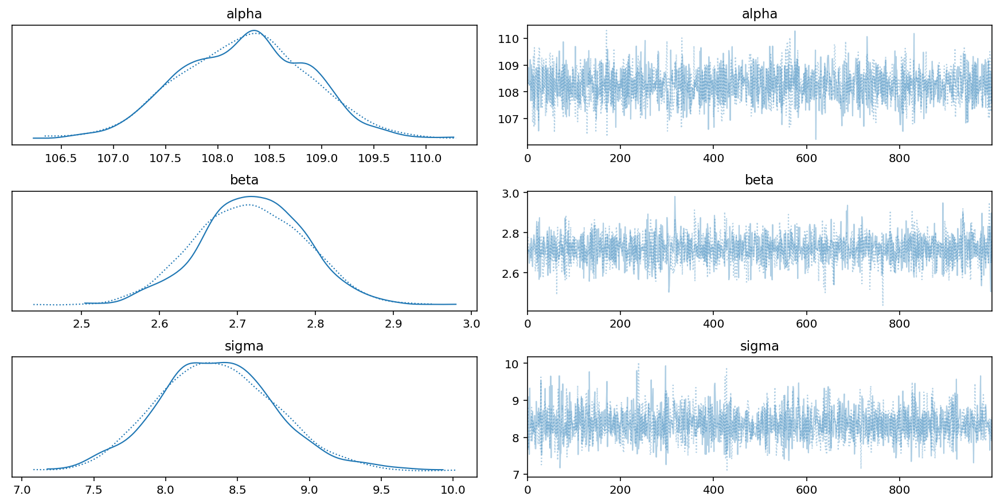

In [148]:
az.plot_trace(trace)
plt.show()

In [149]:
weight_grid = np.linspace(d['weight'].min(), d['weight'].max(), 30)

mu = []
sim = []

for w in weight_grid:
    muw = trace['alpha'] + trace['beta'] * (w - d['weight'].mean())
    simw = stats.norm(muw, trace['sigma']).rvs()

    mu.append(muw)
    sim.append(simw)

mu = np.array(mu).T
sim = np.array(sim).T
muci = az.hdi(mu, hdi_prob=.89)
ci = az.hdi(sim, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


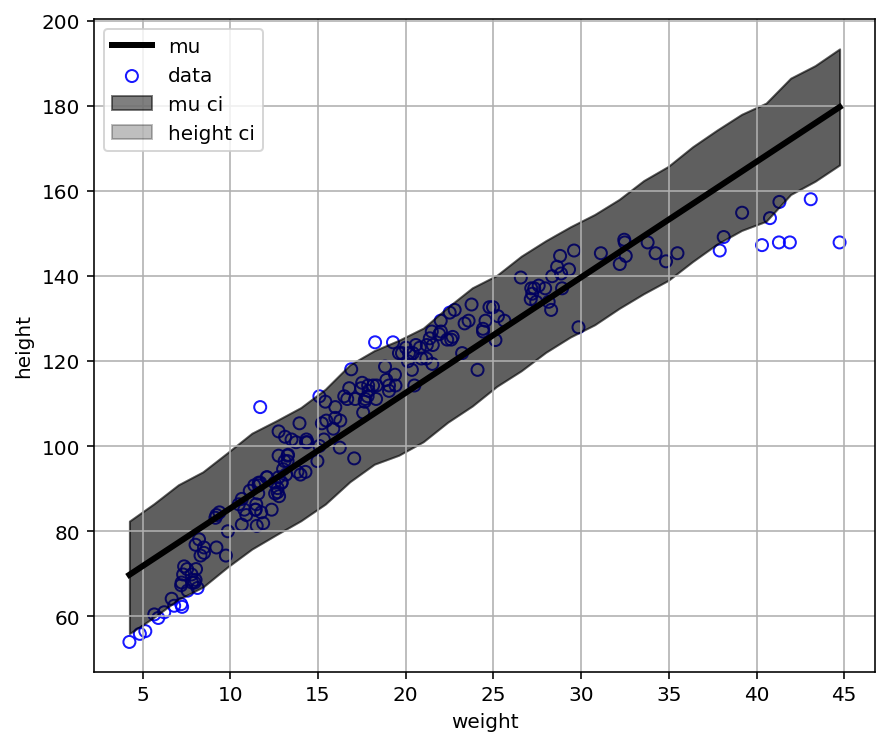

In [150]:
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(d['weight'], d['height'], facecolors='none', edgecolors='blue', alpha=.9, label='data')
ax.plot(weight_grid, mu.mean(axis=0), color='black', linewidth=3, label='mu')
ax.fill_between(weight_grid, ci[:, 0], ci[:, 1], alpha=.5, color='black', label='mu ci')
ax.fill_between(weight_grid, ci[:, 0], ci[:, 1], alpha=.25, color='black', label='height ci')
ax.grid()
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.legend()
plt.show()

Would probably not use a linear model. Poly 2 or 3 would be fine

In [151]:
d['weight_norm'] = (d['weight'] - d['weight'].mean()) / d['weight'].std()
d['weight_norm_2'] = d['weight_norm'] ** 2

In [153]:
with pm.Model() as model:
    alpha = pm.Normal('alpha', d['height'].mean(), 20)
    beta1 = pm.Lognormal('beta1', 0, 1)
    beta2 = pm.Normal('beta2', 0, 1)
    sigma = pm.Exponential('sigma', 1)
    mu = alpha + beta1 * d['weight_norm'] + beta2 * d['weight_norm_2']
    height = pm.Normal('height', mu, sigma, observed=d['height'])
    trace = pm.sample(1000, tune=1000)

<ipython-input-153-18d5819f425b>:8: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, beta2, beta1, alpha]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 21 seconds.


In [154]:
az.summary(trace, hdi_prob=.89, kind='stats')

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_5.5%,hdi_94.5%
alpha,113.857,0.408,113.233,114.512
beta2,-5.570,0.245,-5.964,-5.178
beta1,28.859,0.373,28.278,29.471
sigma,4.298,0.221,3.949,4.638


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


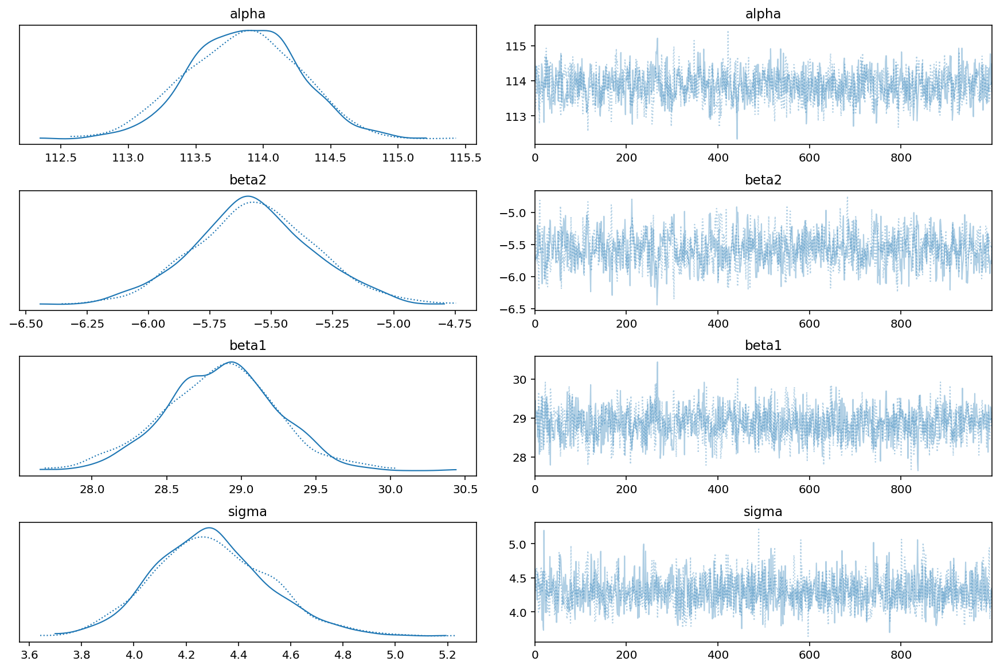

In [155]:
az.plot_trace(trace)
plt.show()

In [156]:
weight_grid = np.linspace(d['weight_norm'].min(), d['weight_norm'].max(), 30)

mu = []
sim = []

for w in weight_grid:
    muw = trace['alpha'] + trace['beta1'] * w + trace['beta2'] * w**2
    simw = stats.norm(muw, trace['sigma']).rvs()

    mu.append(muw)
    sim.append(simw)

mu = np.array(mu).T
sim = np.array(sim).T
muci = az.hdi(mu, hdi_prob=.89)
ci = az.hdi(sim, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


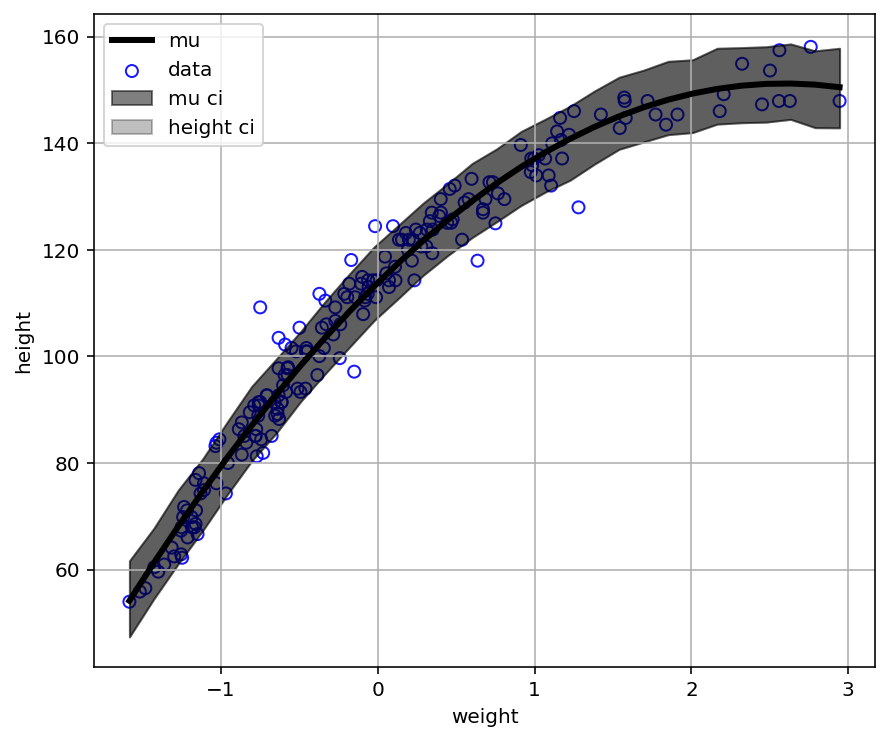

In [158]:
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(d['weight_norm'], d['height'], facecolors='none', edgecolors='blue', alpha=.9, label='data')
ax.plot(weight_grid, mu.mean(axis=0), color='black', linewidth=3, label='mu')
ax.fill_between(weight_grid, muci[:, 0], muci[:, 1], alpha=.5, color='black', label='mu ci')
ax.fill_between(weight_grid, ci[:, 0], ci[:, 1], alpha=.25, color='black', label='height ci')
ax.grid()
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.legend()
plt.show()

### 4H3. 
Suppose a colleague of yours, who works on allometry, glances at the practice problems just above. Your colleague exclaims, “That’s silly. Everyone knows that it’s only the logarithm of body weight that scales with height!” Let’s take your colleague’s advice and see what happens.

**(a)** Model the relationship between height (cm) and the natural logarithm of weight (log-kg). Use the entire Howell1 data frame, all 544 rows, adults and non-adults. Can you interpret the resulting estimates?

**(b)** Begin with this plot: `plot( height ~ weight , data=Howell1 )`. Then use samples from the quadratic approximate posterior of the model in (a) to superimpose on the plot: (1) the predicted mean height as a function of weight, (2) the 97% interval for the mean, and (3) the 97% interval for predicted heights.

In [249]:
d = pd.read_csv('../data/Howell1.csv', sep=';')

In [250]:
d['log_weight'] = np.log(d['weight'])
log_weight_mean = d['log_weight'].mean()

In [251]:
with pm.Model() as model:
    alpha = pm.Normal('alpha', mu=178, sigma=20)
    beta = pm.Lognormal('beta', 0, 1)
    mu = alpha + beta * (d['log_weight'] - log_weight_mean)
    sigma = pm.Exponential('sigma', 1)
    height = pm.Normal('height', mu=mu, sigma=sigma, observed=d['height'])
    trace = pm.sample(10_000, tune=5_000)

<ipython-input-251-4e5167e304e9>:7: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(10_000, tune=5_000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, beta, alpha]


Sampling 2 chains for 5_000 tune and 10_000 draw iterations (10_000 + 20_000 draws total) took 27 seconds.


In [252]:
weight_seq = np.linspace(d['weight'].min(), d['weight'].max(), 50)
log_weight_seq = np.log(weight_seq)

In [253]:
mu = np.array([trace['alpha'] + trace['beta'] * (log_weight - log_weight_mean) for log_weight in log_weight_seq]).T
sim = np.array([np.random.normal(mu[:, i], trace['sigma']) for i in range(len(log_weight_seq))]).T

mu_ci = az.hdi(mu, hdi_prob=.89)
sim_ci = az.hdi(sim, hdi_prob=.89)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


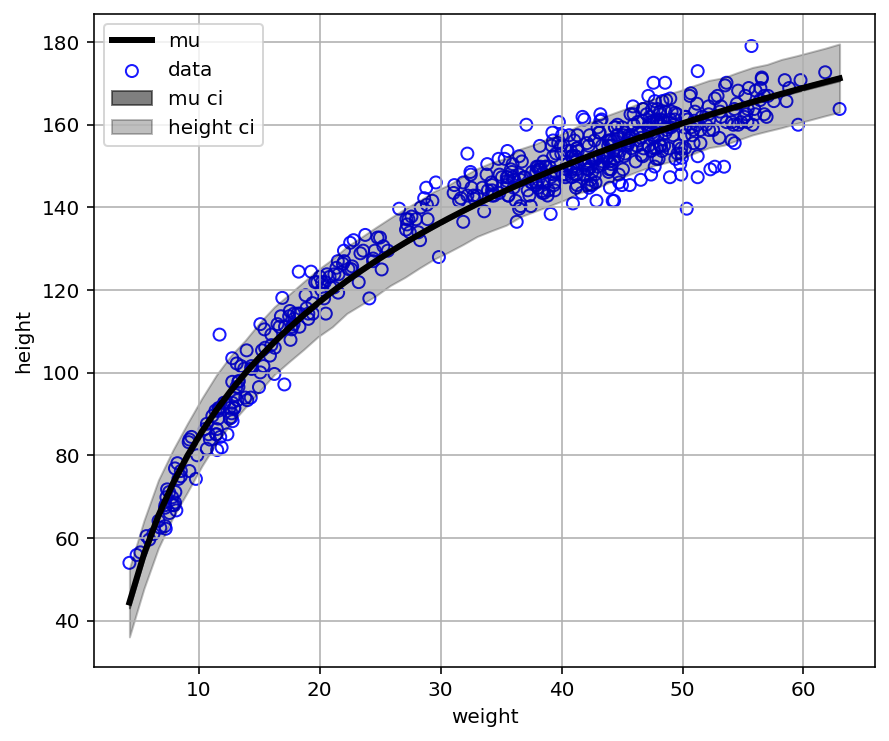

In [254]:
fig, ax = plt.subplots(figsize=(7, 6))
ax.scatter(d['weight'], d['height'], facecolors='none', edgecolors='blue', alpha=.9, label='data')
ax.plot(weight_seq, mu.mean(axis=0), color='black', linewidth=3, label='mu')
ax.fill_between(weight_seq, mu_ci[:, 0], mu_ci[:, 1], alpha=.5, color='black', label='mu ci')
ax.fill_between(weight_seq, sim_ci[:, 0], sim_ci[:, 1], alpha=.25, color='black', label='height ci')
ax.grid()
ax.set_xlabel('weight')
ax.set_ylabel('height')
ax.legend()
plt.show()

### 4H4. 
Plot the prior predictive distribution for the parabolic polynomial regression model in the chapter. You can modify the code that plots the linear regression prior predictive distribution. Can you modify the prior distributions of α, β1, and β2 so that the prior predictions stay within the biologically reasonable outcome space? That is to say: Do not try to fit the data by hand. But do try to keep the curves consistent with what you know about height and weight, before seeing these exact data.

In [255]:
# Generate prior predictive checks
with pm.Model() as model:
    alpha = pm.Normal("alpha", 150, 30)
    b1 = pm.Lognormal("b1", 0, 1)
    b2 = pm.Exponential("b2", 1 / 0.05)
    sigma = pm.Uniform("sigma", 0, 1)
    mu = (
        alpha
        + b1 * (d.weight - np.mean(d.weight))
        + b2 * (d.weight - np.mean(d.weight)) ** 2
    )
    H = pm.Normal("H", mu=mu, sigma=sigma, observed=d.height)
    pp = pm.sample_prior_predictive(samples=1000)  # compute prior predictions

In [256]:
x = np.linspace(0, 70)
mh = np.mean(d.weight)
means = pp["alpha"] + np.outer(x - mh, pp["b1"]) - np.outer((x - mh) ** 2, pp["b2"])

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


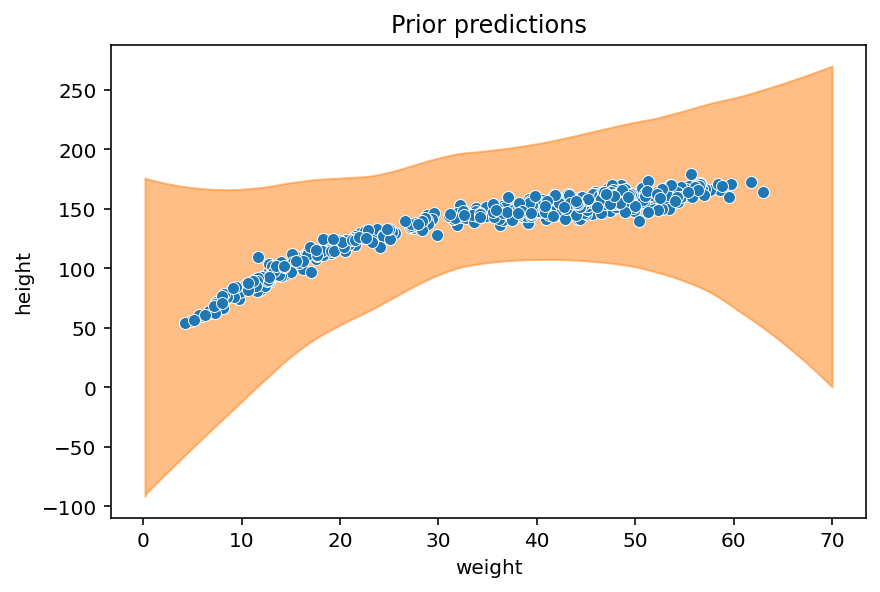

In [257]:
az.plot_hdi(x, means.T, hdi_prob=0.89)
sns.scatterplot(x="weight", y="height", data=d)
plt.title("Prior predictions");


### 4H5.
Return to `data(cherry_blossoms)` and model the association between blossom date (doy) and March temperature (temp). Note that there are many missing values in both variables. You may consider a linear model, a polynomial, or a spline on temperature. How well does temperature trend predict the blossom trend?

In [258]:
d = pd.read_csv('../data/cherry_blossoms.csv')

In [262]:
d2 = d[['doy', 'temp']].dropna().reset_index(drop=True)

[]

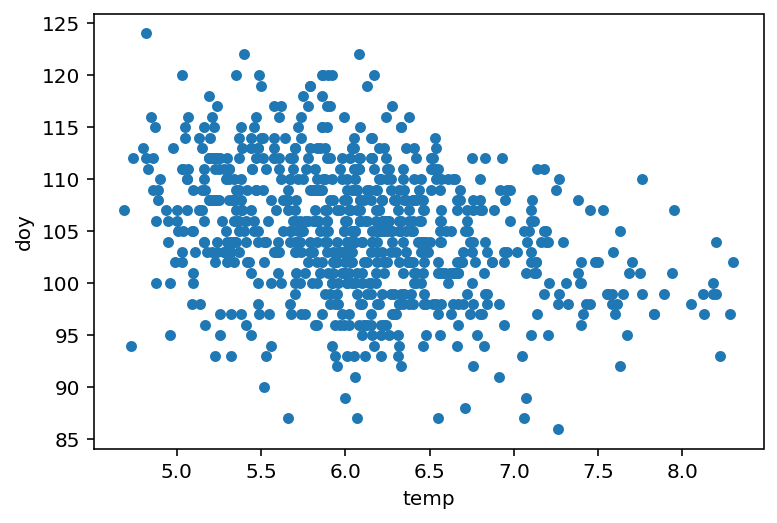

In [267]:
d2.plot.scatter(x='temp', y='doy')
plt.plot()

In [272]:
d2['temp_s'] = (d2['temp'] - d2['temp'].mean()) / d2['temp'].std()
d2['temp_s2'] = d2['temp_s'] ** 2

In [273]:
temp_s_mean = d2['temp_s'].mean()
temp_s2_mean = d2['temp_s2'].mean()

In [274]:
with pm.Model() as model:
    a = pm.Normal('a', mu=d2['doy'].mean(), sigma=20)
    b1 = pm.Normal('b1', mu=0, sigma=1)
    b2 = pm.Normal('b2', mu=0, sigma=1)
    sigma = pm.Exponential('sigma', lam=1)
    mu = a + b1 * d2['temp_s'] + b2 * d2['temp_s2']
    doy = pm.Normal('doy', mu=mu, sigma=sigma, observed=d2['doy'])
    
    trace = pm.sample(10_000, tune=5_000)

<ipython-input-274-76ed5cb8c62e>:9: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(10_000, tune=5_000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, b2, b1, a]


Sampling 2 chains for 5_000 tune and 10_000 draw iterations (10_000 + 20_000 draws total) took 35 seconds.


In [296]:
temp_grid = np.linspace(d2['temp'].min(), d2['temp'].max(), 25)
temp_s_grid = (temp_grid - d2['temp'].mean()) / d2['temp'].std()

In [293]:
mu = trace['a'] + np.outer(temp_s_grid, trace['b1']) + np.outer(temp_s_grid**2, trace['b2'])
sim = np.random.normal(mu, trace['sigma'])

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


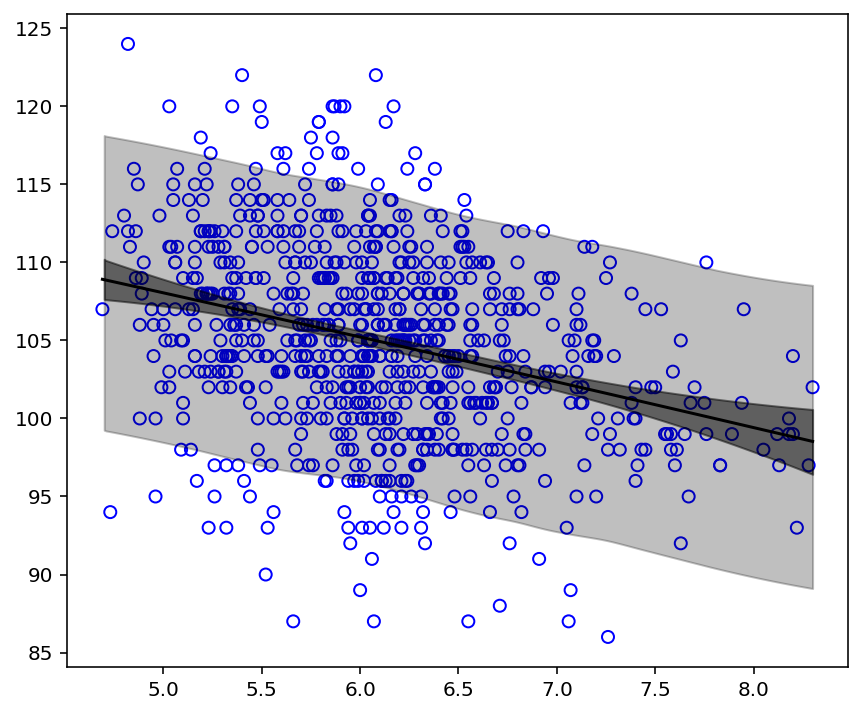

In [319]:
fig, ax = plt.subplots(1, 1, figsize=(7, 6))

ax.scatter(d2['temp'], d2['doy'], facecolors='none', edgecolors='blue')
ax.plot(temp_grid, mu.mean(axis=1), color='black')
az.plot_hdi(temp_grid, mu.T, hdi_prob=.89, ax=ax, color='black', fill_kwargs=dict(alpha=.5))
az.plot_hdi(temp_grid, sim.T, hdi_prob=.89, ax=ax, color='black', fill_kwargs=dict(alpha=.25))
plt.show()

### 4H6.
Simulate the prior predictive distribution for the cherry blossom spline in the chapter. Adjust the prior on the weights and observe what happens. What do you think the prior on the weights is doing?

In [320]:
d2 = d[d['doy'].notna()].reset_index(drop=True)
num_knots = 15
knot_list = np.quantile(d2['year'], q=np.linspace(0, 1, num_knots))

In [321]:
B = bs(d2['year'], knots=knot_list[1:-1], degree=3, include_intercept=True).values

In [328]:
with pm.Model() as model:
    a = pm.Normal('a', mu=100, sigma=5)
    sigma = pm.Exponential('sigma', lam=1/100)
    w = pm.Normal('w', mu=0, sigma=5, shape=B.shape[1])
    mu = pm.Deterministic('mu', a + pm.math.dot(B, w.T))
    D = pm.Normal('D', mu=mu, sigma=sigma, observed=d2['doy'])
    pp = pm.sample_prior_predictive(5000)

/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


Text(0, 0.5, 'days in year')

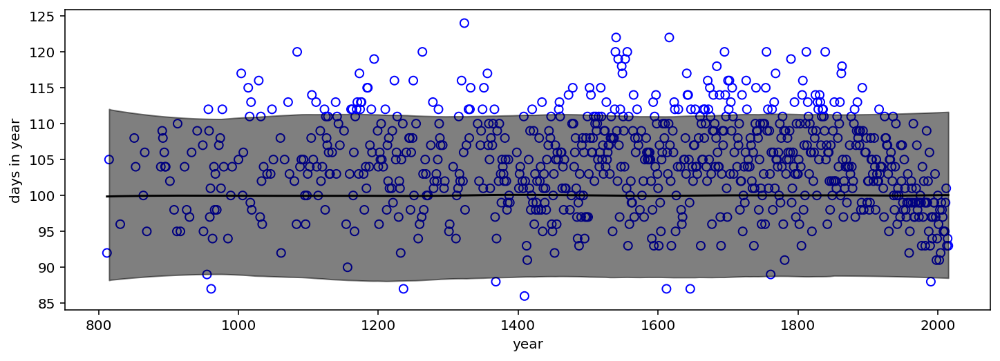

In [337]:
fig, ax = plt.subplots(figsize=(12, 4))
ax.scatter(d2.year, d2.doy, edgecolors='blue', facecolors='none')
ax.plot(d2.year, pp['mu'].mean(axis=0), color='black')
az.plot_hdi(d2.year, pp["mu"], color="black", ax=ax, fill_kwargs={'alpha': .5})
ax.set_xlabel("year")
ax.set_ylabel("days in year")

### 4H8.
The cherry blossom spline in the chapter used an intercept α, but technically it doesn’t require one. The first basis functions could substitute for the intercept. Try refitting the cherry blossom spline without the intercept. What else about the model do you need to change to make this work?

In [338]:
d2 = d[d['doy'].notna()].reset_index(drop=True)
num_knots = 15
knot_list = np.quantile(d2['year'], q=np.linspace(0, 1, num_knots))

In [339]:
B = bs(d2['year'], knots=knot_list[1:-1], degree=3, include_intercept=False).values

In [340]:
with pm.Model() as model:
    a = pm.Normal('a', mu=100, sigma=10)
    sigma = pm.Exponential('sigma', lam=1)
    w = pm.Normal('w', mu=0, sigma=10, shape=B.shape[1])
    mu = pm.Deterministic('mu', a + pm.math.dot(B, w.T))
    D = pm.Normal('D', mu=mu, sigma=sigma, observed=d2['doy'])
    trace = pm.sample(10_000, tune=5_000)

<ipython-input-340-8d447e40c58e>:7: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace = pm.sample(10_000, tune=5_000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [w, sigma, a]


Sampling 2 chains for 5_000 tune and 10_000 draw iterations (10_000 + 20_000 draws total) took 79 seconds.
There were 292 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7086201937036538, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.


/Users/giuliano.ferrari/Documents/Other/statistical-rethinking/.env/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(


Text(0, 0.5, 'days in year')

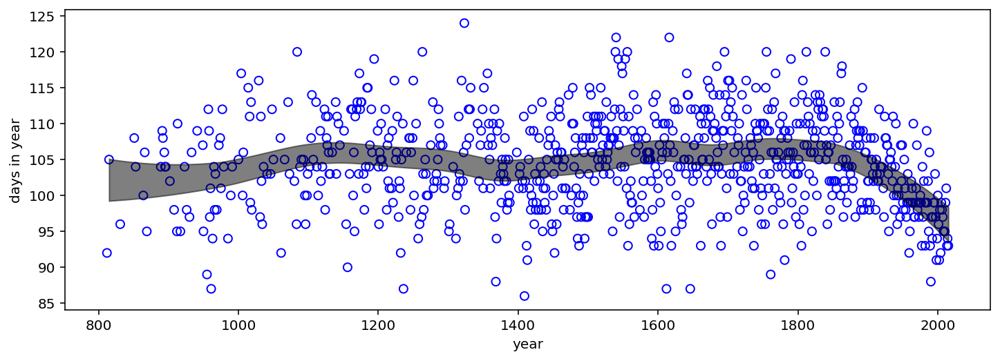

In [345]:
fig, ax = plt.subplots(figsize=(12, 4))
ax.scatter(d2.year, d2.doy, edgecolors='blue', facecolors='none')
# ax.plot(d2.year, trace['mu']., color='black')
az.plot_hdi(d2.year, trace["mu"], color="black", ax=ax, fill_kwargs={'alpha': .5})
ax.set_xlabel("year")
ax.set_ylabel("days in year")